# Introduction
Since the overall similarity of the networks across predictor is lower than the similarity of different kinase networks predicted by the same predictor, we want to know if that is still high than random chance. This notebook:
1. randomized the predicted networks with preserved kinase degree
2. compares the similarity of the kinase networks predicted by the different predictors.  The similarity is measured by the Jaccard's Index. The Jaccard's index is the ratio of the intersection to the union of the two sets.  The values range from 0 for no similarity to 1 for the complete overlap of the two compared sets.  
3. plots the distribution of the same-kinase similarity ranks.


In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# customized python modules (see the .py files for detail documentation)
import meltMatrix # convert the matrix to a list-like dataframe
import df_by_kin  # split the prediction data into two dataframe by kinase type
import kinase_mutual_information, plot_kinase_heatmap # measures and plots the network similarity by Jaccard's Index
import sameKinase_rank, plot_sameKinase_rank # plots the same-kinase similarity ranking 


In [2]:
# file location
# local (../../)
base = '../../'


In [3]:
# input files

# kinase map
KinaseMap = base + 'Data/Map/globalKinaseMap.csv'

# input files
# prediction data
PhosphoPICK1 = base + 'Data/comparison/Thresh/PhosphoPICK/all/PhosphoPICK_0.1.csv'                 #low
PhosphoPICK06 = base + 'Data/comparison/Thresh/PhosphoPICK/all/PhosphoPICK_0.06.csv'               #med
PhosphoPICK02 = base + 'Data/comparison/Thresh/PhosphoPICK/all/PhosphoPICK_0.02.csv'               #high

NetworKIN03 = base + 'Data/comparison/Thresh/NetworKIN/all/NetworKIN_0.3.csv'                      #low
NetworKIN05 = base + 'Data/comparison/Thresh/NetworKIN/all/NetworKIN_0.5.csv'                      #med
NetworKIN1 = base + 'Data/comparison/Thresh/NetworKIN/all/NetworKIN_1.csv'                         #high

GPS_lo = base + 'Data/comparison/Thresh/GPS5.0/all/GPS_low.csv'
GPS_md = base + 'Data/comparison/Thresh/GPS5.0/all/GPS_medium.csv'
GPS_hi = base + 'Data/comparison/Thresh/GPS5.0/all/GPS_high.csv'

# output files for randomized networks (df/heatmaps/ranks)
random_df_dir = base + 'Data/comparison/randomizeNetwork/dataframe/'
random_rank_dir = base + 'Data/comparison/randomizeNetwork/kinaseNetworkSimilarity_acrossPredictor/Rank/'
random_heatmap_dir = base + 'Data/comparison/randomizeNetwork/kinaseNetworkSimilarity_acrossPredictor/'


In [5]:
# load df, convert the matrix to a list-like df
cols = ['Kinase Name', 'substrate_id', 'site']
# PhosphoPICK
pp1_df = meltMatrix.meltMatrix(PhosphoPICK1)[cols]
pp06_df = meltMatrix.meltMatrix(PhosphoPICK06)[cols]
pp02_df = meltMatrix.meltMatrix(PhosphoPICK02)[cols]
# NetworKIN
nw03_df = meltMatrix.meltMatrix(NetworKIN03)[cols]
nw05_df = meltMatrix.meltMatrix(NetworKIN05)[cols]
nw1_df = meltMatrix.meltMatrix(NetworKIN1)[cols]
# GPS
gpsl_df = meltMatrix.meltMatrix(GPS_lo)[cols]
gpsm_df = meltMatrix.meltMatrix(GPS_md)[cols]
gpsh_df = meltMatrix.meltMatrix(GPS_hi)[cols]


### Randomize the Predicted Networks

In [6]:
def shuffle(df, n=1, axis=0):
    """
    random shuffle of the given dataframe
    """
    df = df.copy()
    for _ in range(n):
        df.apply(np.random.shuffle, axis=axis)
    return df


In [7]:
def randomizeNetwork (df, outfile):
    """
    randomize the network of given prediction dataframe 
    preserve the kinase network degree
    
    Parameters
    ----------
    df:      prediction dataframe
    outfile: output file location
        
    Returns
    --------
    df: randomize the network
    """
    # define columns 
    cols = ['Kinase Name', 'substrate_id', 'site']
    # create an empty df for the random network
    df_random = pd.DataFrame(columns = cols)
    # define kinase degree df: get the predicted kinases and its network degrees of the predicted network
    degrees = df.groupby('Kinase Name').count().sort_values(by ='substrate_id', ascending=False ).reset_index()
    # get a list of unique substrates predicted 
    sub_li = df[['substrate_id', 'site']].drop_duplicates().reset_index(drop = True)
    # shuffle the list once
    sub_li = shuffle(sub_li).reset_index(drop = True)
    # loop the kinase degree df
    for index, row in degrees.iterrows():
        # get the kinase name 
        kinase = degrees.at[index,'Kinase Name']
        # get the degree
        kin_degree = int(degrees.at[index,'substrate_id'])
        # get the start index: the index of the first empty row in df_random
        start_idx = df_random['Kinase Name'].count()
        # get the end index: start index + kinase degree
        end_idx = start_idx + kin_degree
        # get a list of random substrates (list len = kinase degree)
        new_subs = sub_li.sample(n = kin_degree)
        # append the list of substrate to start index
        df_random = df_random.append(new_subs, ignore_index = True)
        # fill the kinase name
        df_random['Kinase Name'][start_idx:end_idx] = kinase
            
    df_random.to_csv(outfile+'.csv', index=False)
    return df_random

### Randomize the Networks

**PhosphoPICK**

In [8]:
# Low
pp1_df_r = randomizeNetwork (pp1_df, random_df_dir + 'PhosphoPICK_low_all_random')
# Med
pp06_df_r = randomizeNetwork (pp06_df, random_df_dir + 'PhosphoPICK_med_all_random')
# High
pp02_df_r = randomizeNetwork (pp02_df, random_df_dir + 'PhosphoPICK_high_all_random')

**GPS**

In [9]:
# Low
gpsl_df_r = randomizeNetwork (gpsl_df, random_df_dir + 'GPS_low_all_random')
# Med
gpsm_df_r = randomizeNetwork (gpsm_df, random_df_dir + 'GPS_med_all_random')
# High
gpsh_df_r = randomizeNetwork (gpsh_df, random_df_dir + 'GPS_high_all_random')


**NetworKIN**

In [10]:
# Low
nw03_df_r = randomizeNetwork (nw03_df, random_df_dir + 'NetworKIN_low_all_random')
# Med
nw05_df_r = randomizeNetwork (nw05_df, random_df_dir + 'NetworKIN_med_all_random')
# High
nw1_df_r = randomizeNetwork (nw1_df, random_df_dir + 'NetworKIN_high_all_random')


In [7]:
# load dfs, if not already defined
# # Low
# pp1_df_r = pd.read_csv(random_df_dir + 'PhosphoPICK_low_all_random.csv')
# # Med
# pp06_df_r = pd.read_csv(random_df_dir + 'PhosphoPICK_med_all_random.csv')
# # High
# pp02_df_r = pd.read_csv(random_df_dir + 'PhosphoPICK_high_all_random.csv')
# # Low
# gpsl_df_r = pd.read_csv(random_df_dir + 'GPS_low_all_random.csv')
# # Med
# gpsm_df_r = pd.read_csv(random_df_dir + 'GPS_med_all_random.csv')
# # High
# gpsh_df_r = pd.read_csv(random_df_dir + 'GPS_high_all_random.csv')
# # Low
# nw03_df_r = pd.read_csv(random_df_dir + 'NetworKIN_low_all_random.csv')
# # Med
# nw05_df_r = pd.read_csv(random_df_dir + 'NetworKIN_med_all_random.csv')
# # High
# nw1_df_r = pd.read_csv(random_df_dir + 'NetworKIN_high_all_random.csv')



**All Analysis are done in Y kinase vs S/T kinase group**

In [11]:
# group and define df as y kinase and s/t kinase groups
# PhosphoPICK
pp1_y_r, pp1_st_r = df_by_kin.df_by_kin(pp1_df_r)
pp06_y_r, pp06_st_r = df_by_kin.df_by_kin(pp06_df_r)
pp02_y_r, pp02_st_r = df_by_kin.df_by_kin(pp02_df_r)
# NetworKIN
nw03_y_r, nw03_st_r = df_by_kin.df_by_kin(nw03_df_r)
nw05_y_r, nw05_st_r = df_by_kin.df_by_kin(nw05_df_r)
nw1_y_r, nw1_st_r = df_by_kin.df_by_kin(nw1_df_r)
# GPS
gpsl_y_r, gpsl_st_r = df_by_kin.df_by_kin(gpsl_df_r)
gpsm_y_r, gpsm_st_r = df_by_kin.df_by_kin(gpsm_df_r)
gpsh_y_r, gpsh_st_r = df_by_kin.df_by_kin(gpsh_df_r)


### Kinase Network Similarity between Randomized prediction Networks

### NetworKIN(0.3) vs PhosphoPICK (0.1)
- index: kinases in NetworKIN
- column: kinases in PhosphoPICK

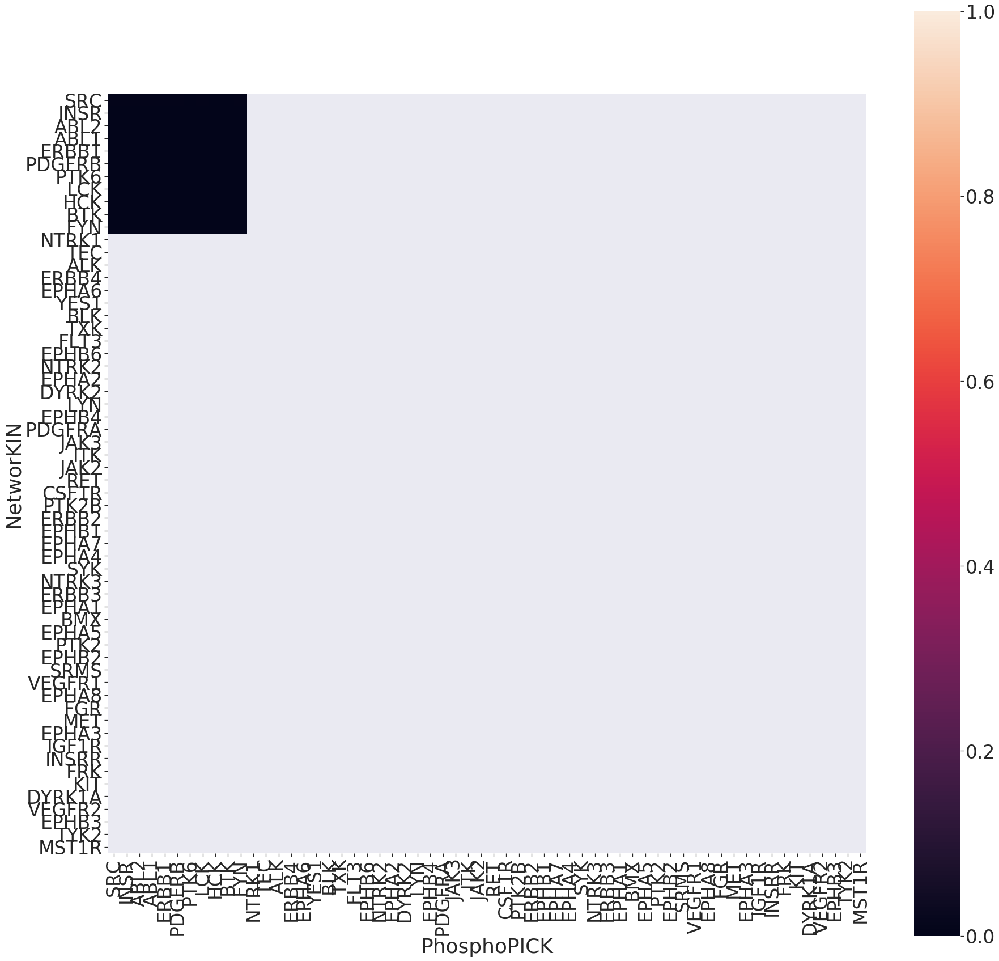

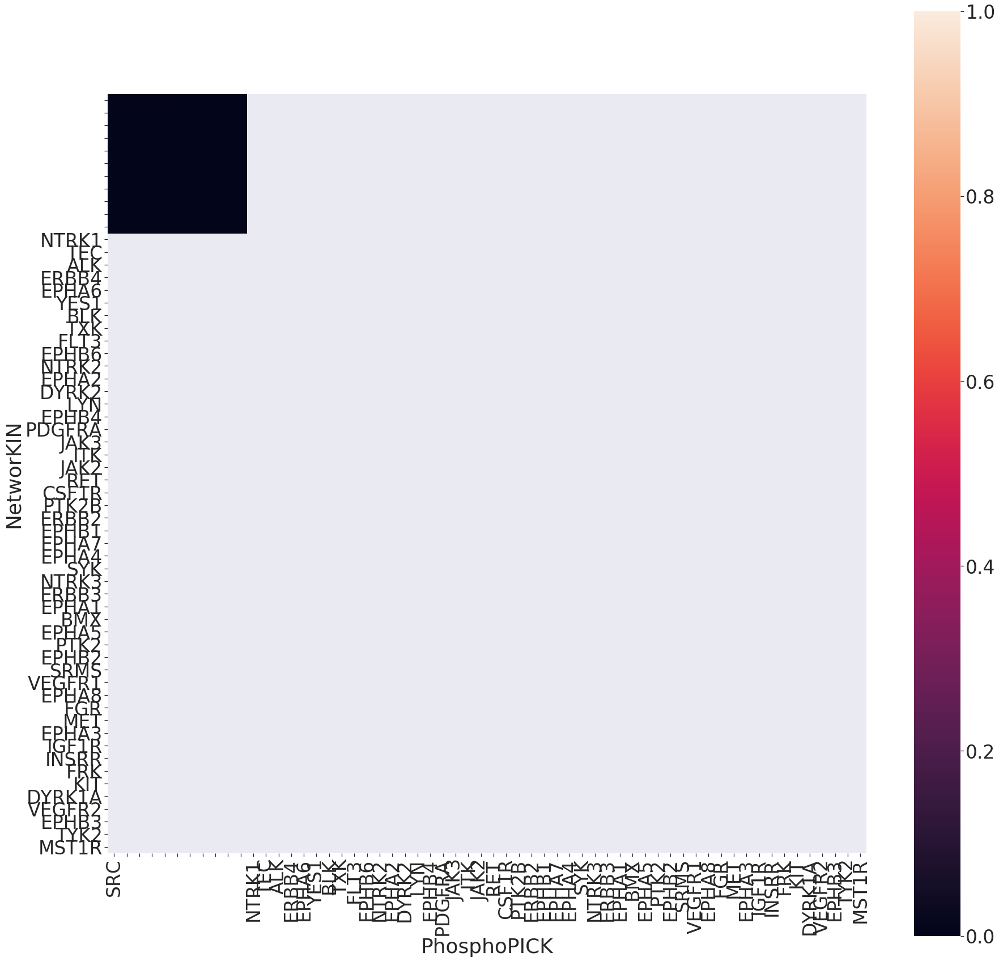

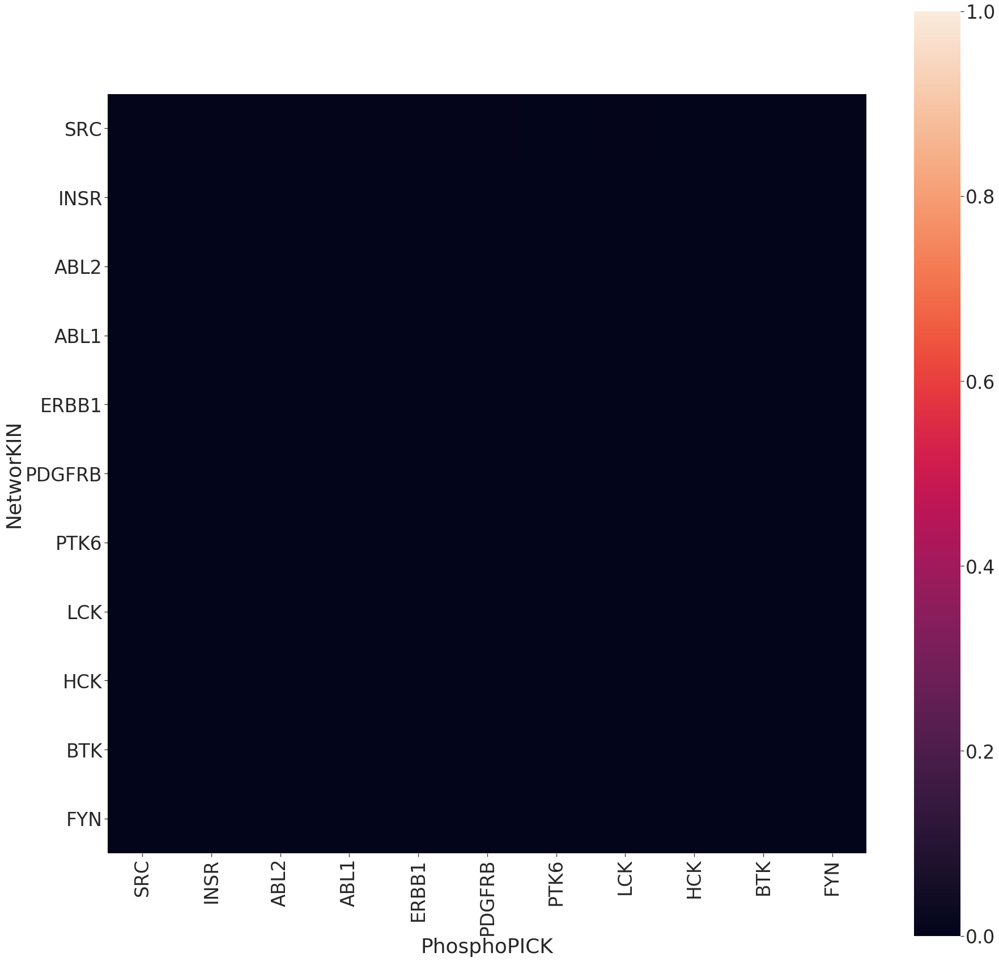

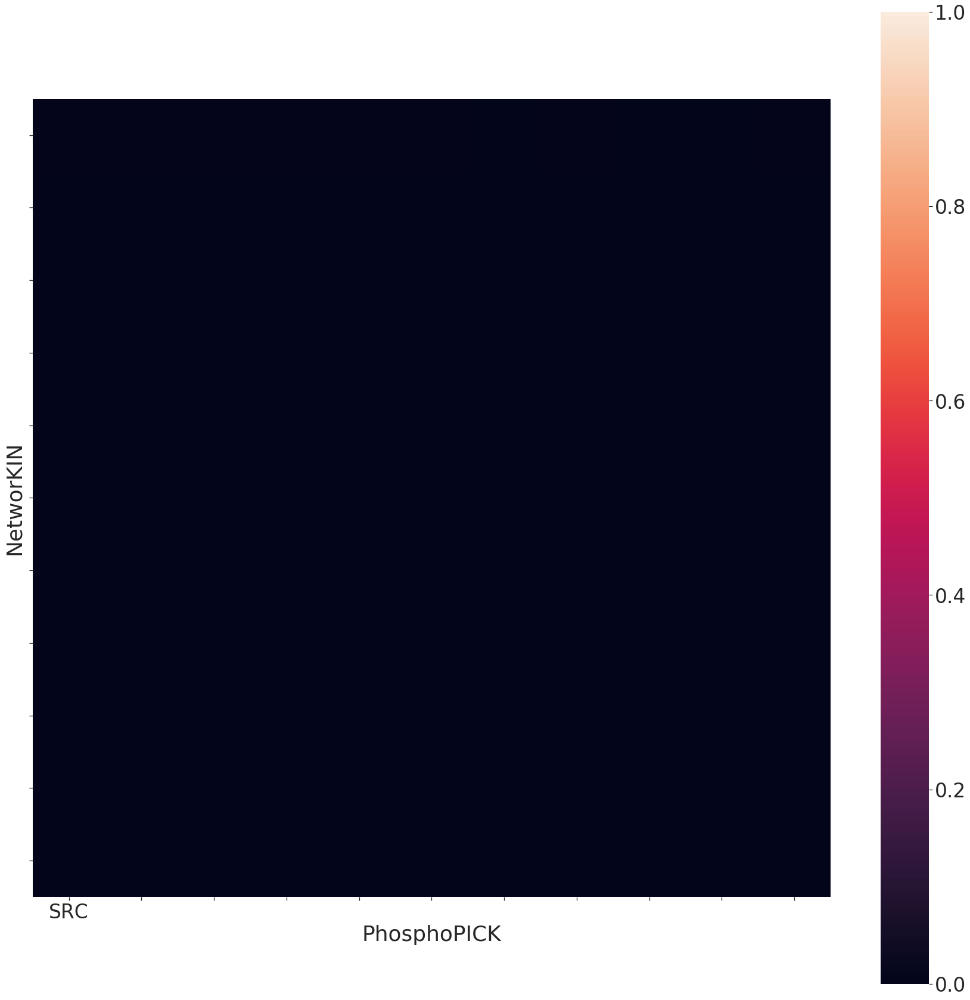

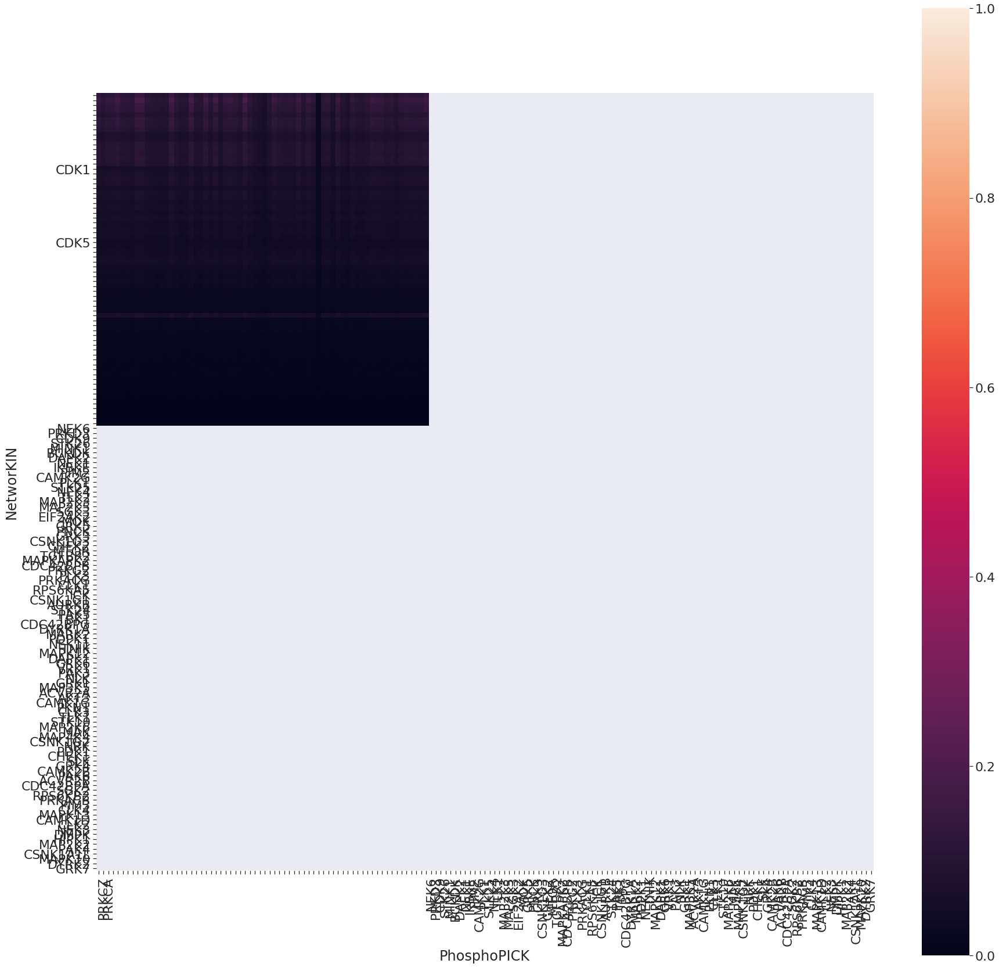

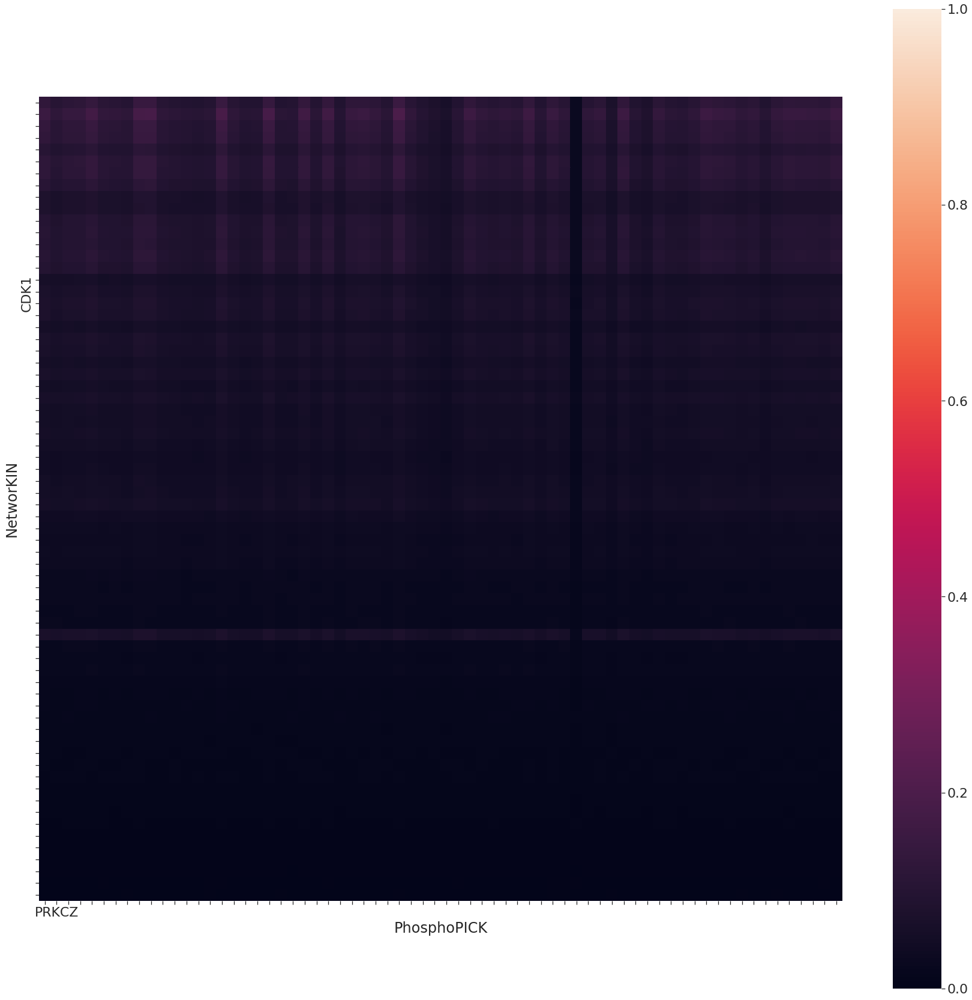

In [12]:
# Plot the network similarity of Jaccard's Index
# Y kinases
# calculate Jaccard's Indexes
heatmap_y_l_r = kinase_mutual_information.between_predictors(nw03_y_r, pp1_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_PhosphoPICK_low_Y_kinase_heatmap_df')
# plot the heatmap
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_l_r, random_heatmap_dir  + 'NetworKIN_vs_PhosphoPICK_low_Y_kinase', 'NetworKIN', 'PhosphoPICK', 'y')

# S/Y kinases
heatmap_st_l_r = kinase_mutual_information.between_predictors(nw03_st_r, pp1_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_PhosphoPICK_low_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_l_r, random_heatmap_dir + 'NetworKIN_vs_PhosphoPICK_low_ST_kinase', 'NetworKIN', 'PhosphoPICK', 'st')


11 overlapped kinases 
 NetworKIN :  50 kinases 
 PhosphoPICK :  21 kinases 



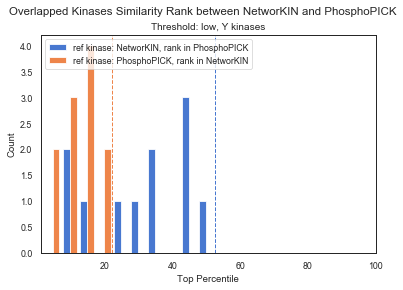

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


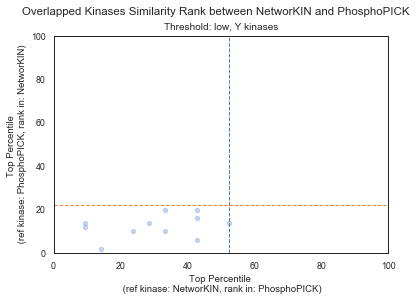

68 overlapped kinases 
 NetworKIN :  140 kinases 
 PhosphoPICK :  87 kinases 



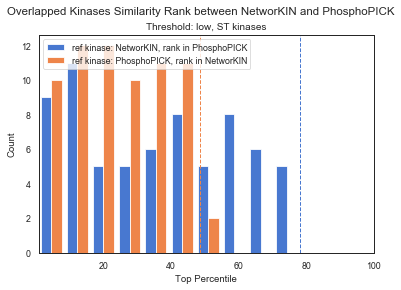

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


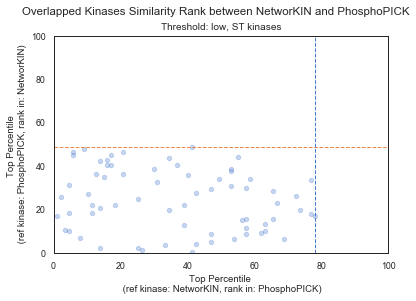

In [13]:
# Plot the same-kinase network similarly ranks in the compared predictors 
# Y kinase
# load the Jaccard's index matrix if not already defined
heatmap_y_l_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_PhosphoPICK_low_Y_kinase_heatmap_df.csv', index_col = 0)
# get the same-kinase similarly ranks
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_l_r, nw03_y_r, pp1_y_r , 'NetworKIN', 'PhosphoPICK' )
# save the ranking summary df 
kin_rank_y_r.to_csv(random_rank_dir + 'low_Y_nw_pp.csv')
# plot the hist and scatter plots for the ranking
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'nw', 'pp', 'low', 'Y kinases', random_rank_dir)

# S/T kinase
heatmap_st_l_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_PhosphoPICK_low_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_l_r, nw03_st_r, pp1_st_r , 'NetworKIN', 'PhosphoPICK' )
kin_rank_st_r.to_csv(random_rank_dir + 'low_ST_nw_pp.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'nw', 'pp', 'low', 'ST kinases', random_rank_dir)


### NetworKIN(0.5) vs PhosphoPICK (0.06)
- index: kinases in NetworKIN
- column: kinases in PhosphoPICK

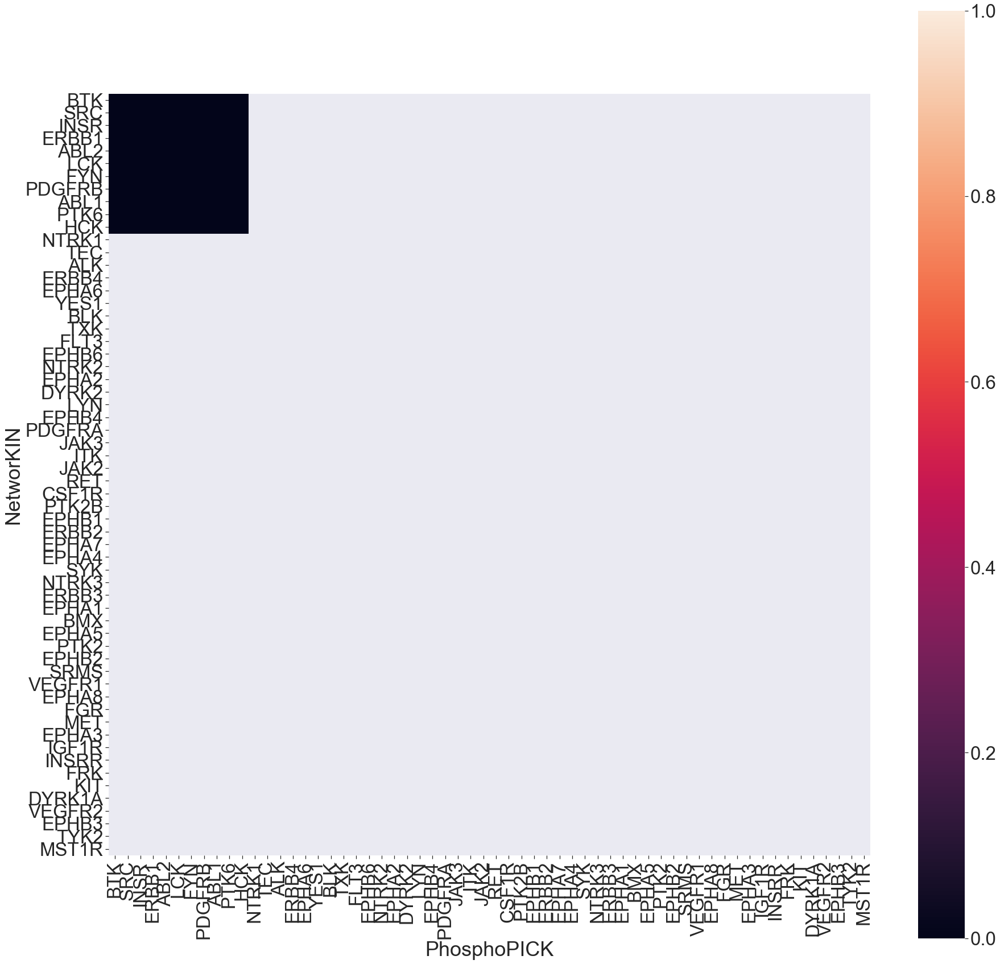

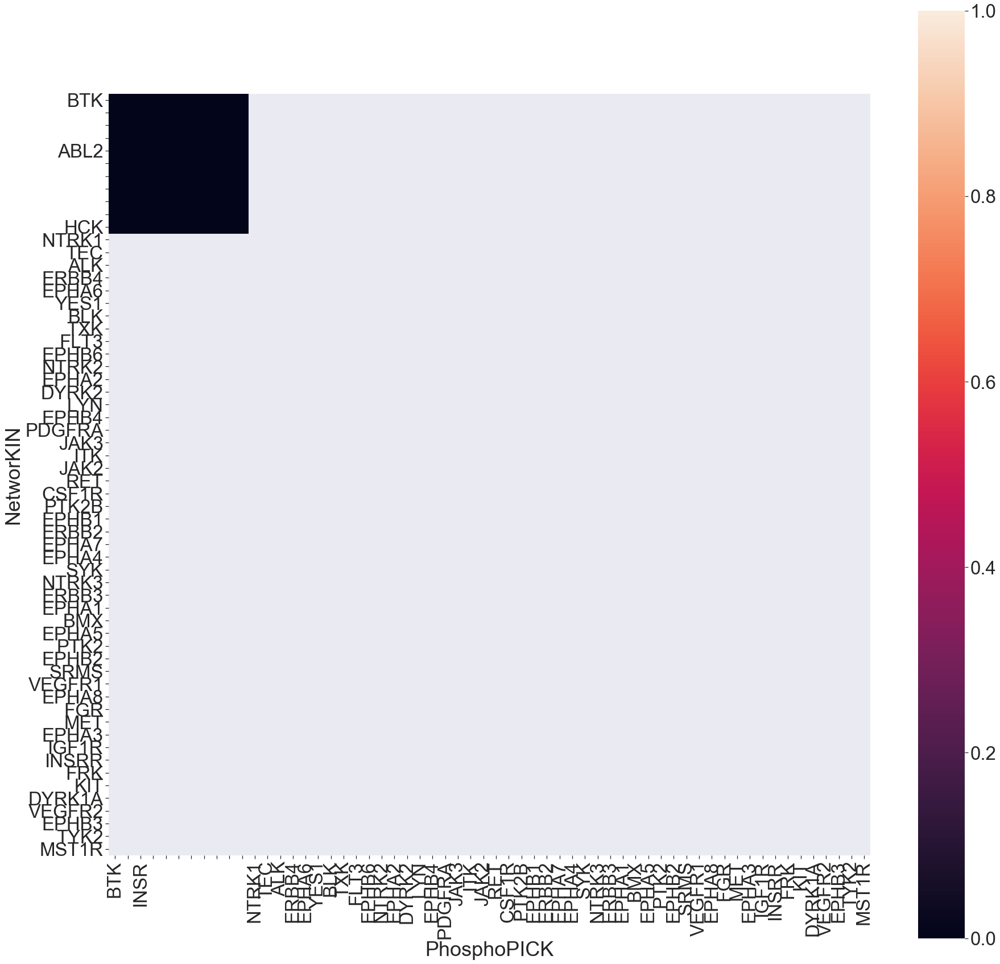

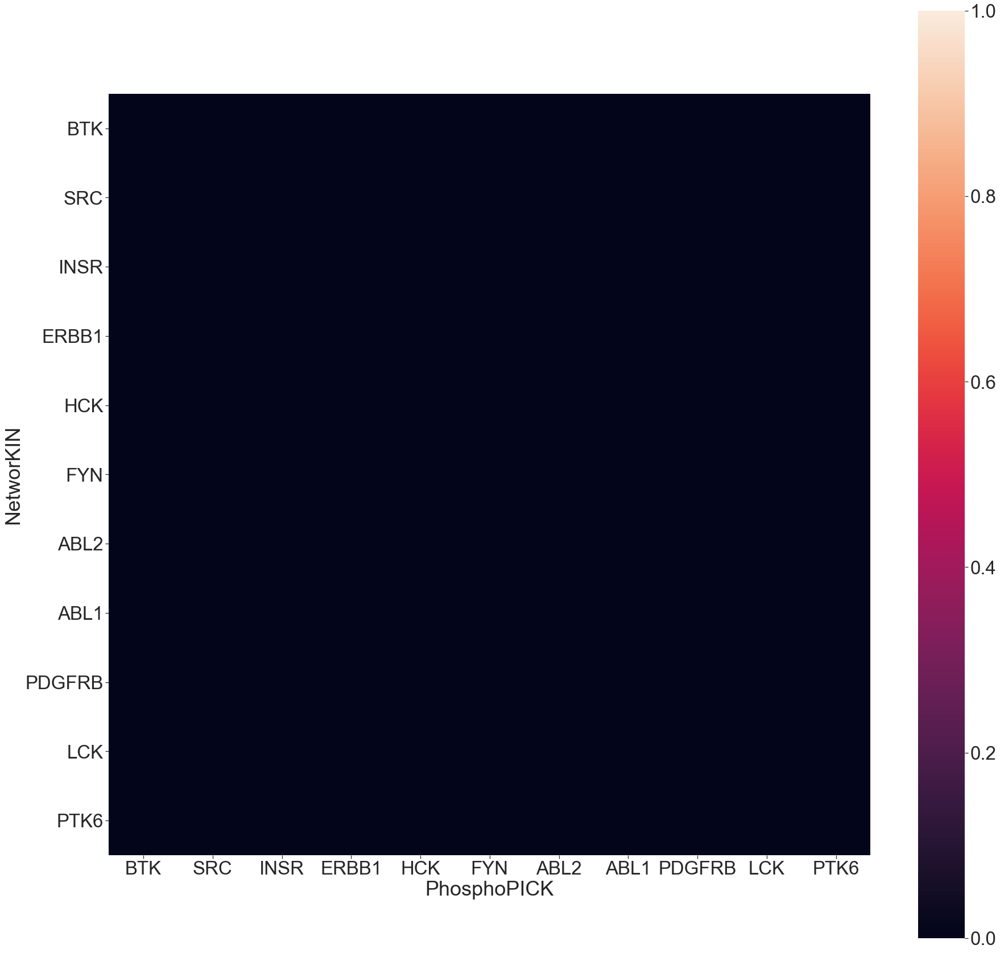

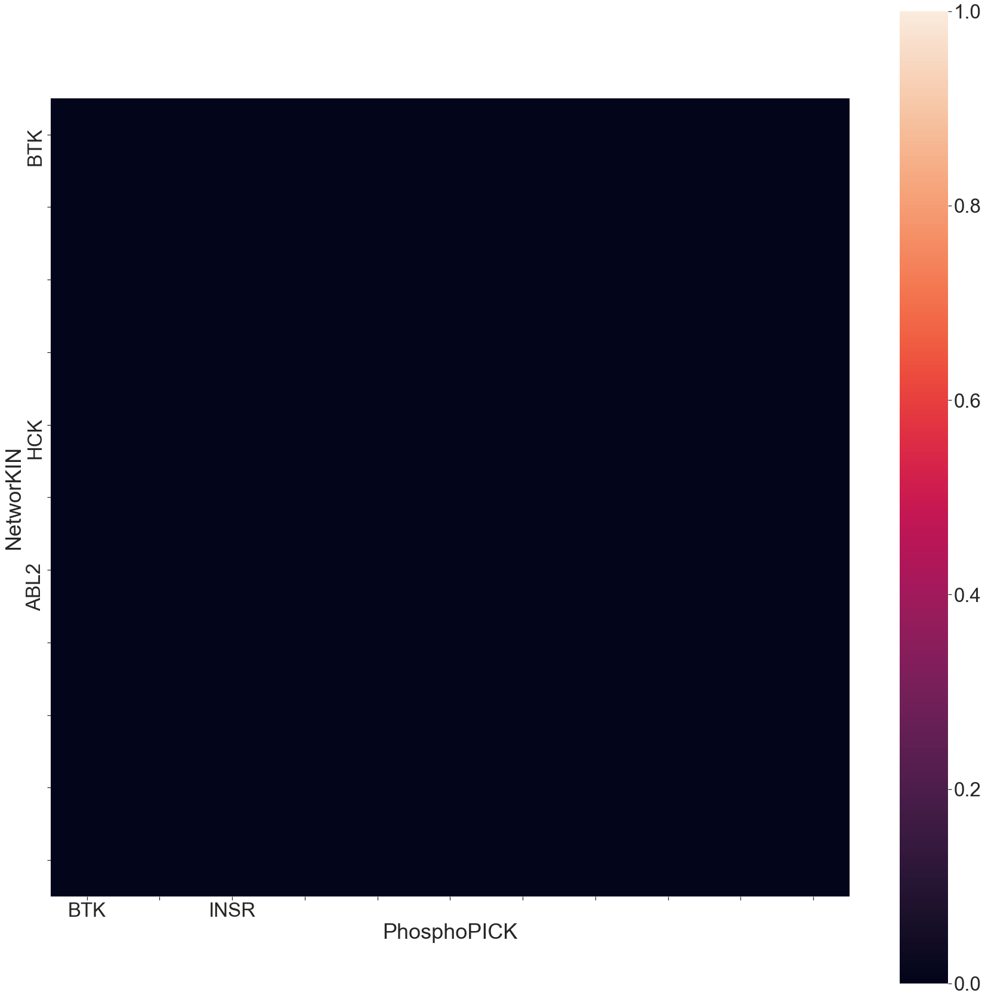

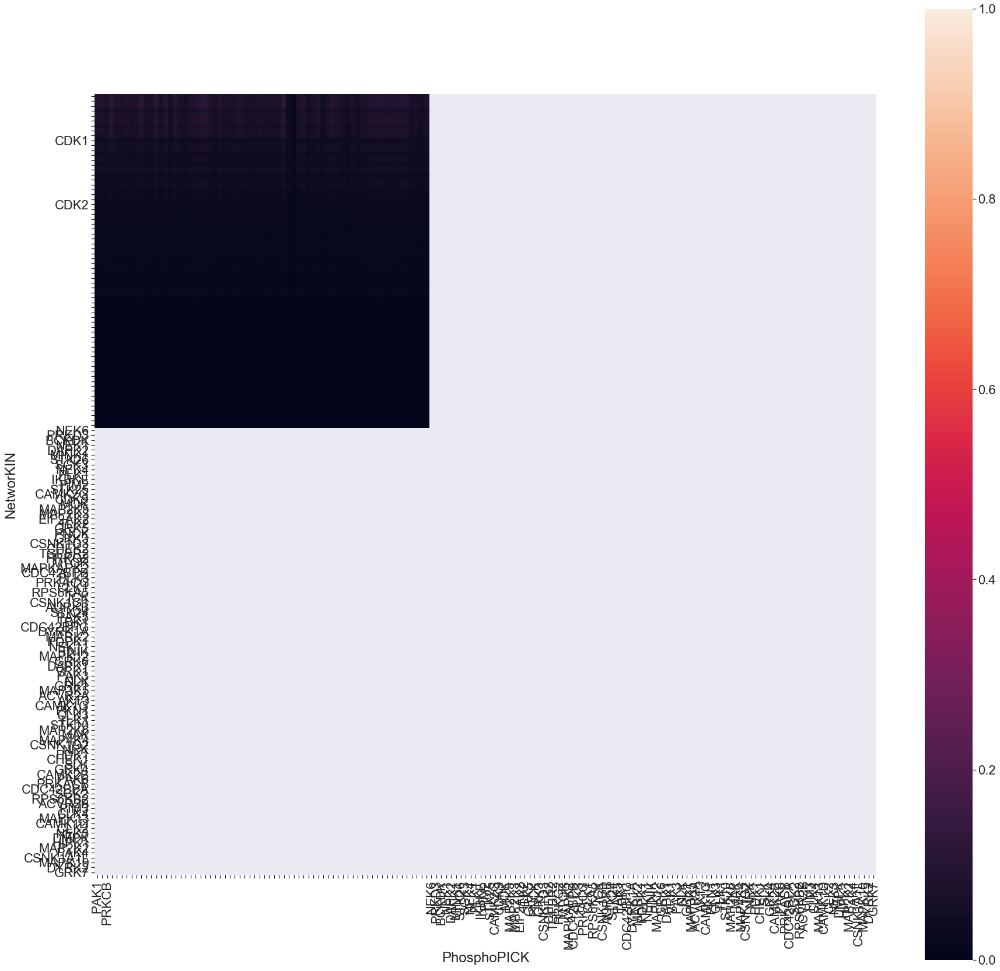

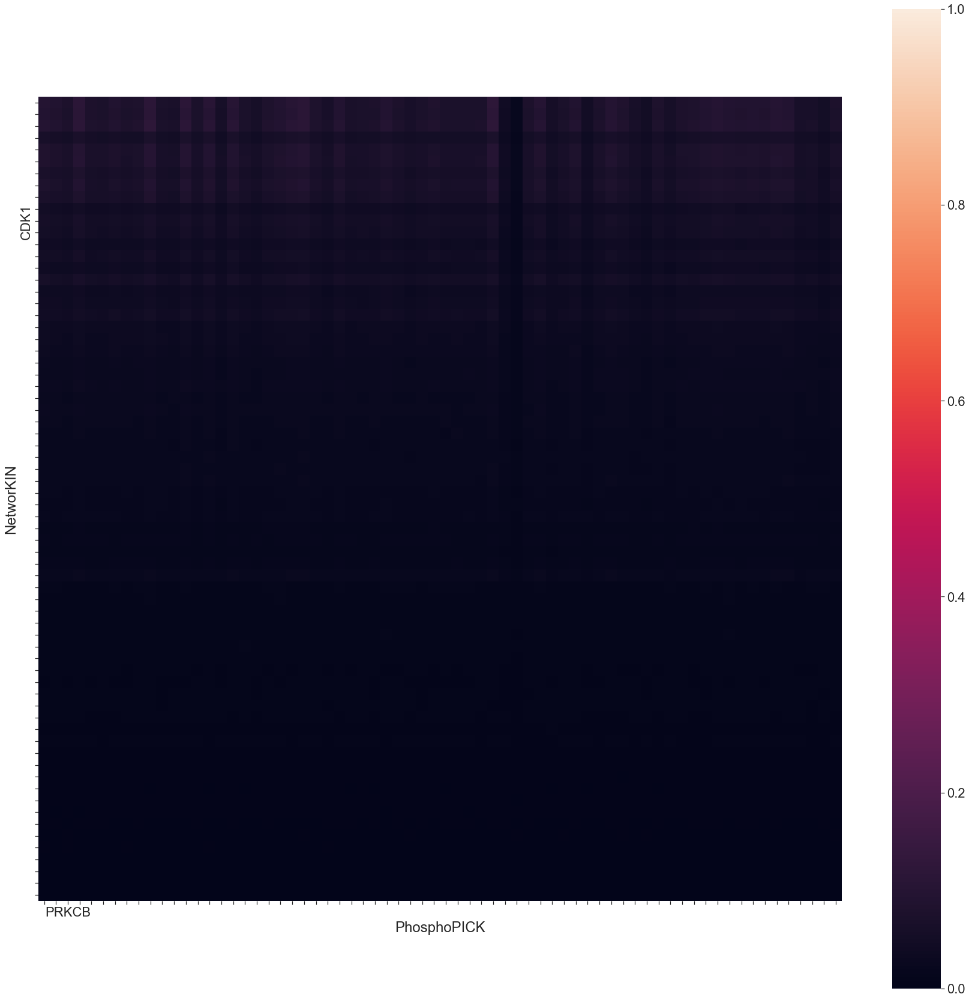

In [14]:
heatmap_y_m_r = kinase_mutual_information.between_predictors(nw05_y_r, pp06_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_PhosphoPICK_med_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_m_r, random_heatmap_dir  + 'NetworKIN_vs_PhosphoPICK_med_Y_kinase', 'NetworKIN', 'PhosphoPICK', 'y')

heatmap_st_m_r = kinase_mutual_information.between_predictors(nw05_st_r, pp06_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_PhosphoPICK_med_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_m_r, random_heatmap_dir + 'NetworKIN_vs_PhosphoPICK_med_ST_kinase', 'NetworKIN', 'PhosphoPICK', 'st')


11 overlapped kinases 
 NetworKIN :  50 kinases 
 PhosphoPICK :  21 kinases 



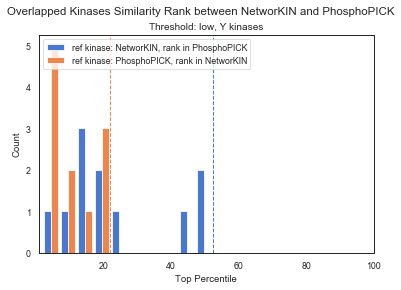

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


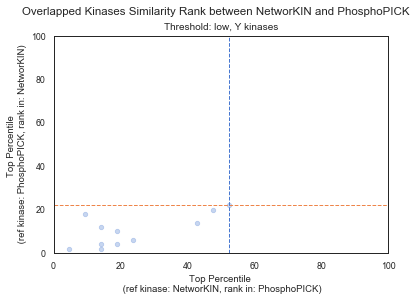

68 overlapped kinases 
 NetworKIN :  140 kinases 
 PhosphoPICK :  87 kinases 



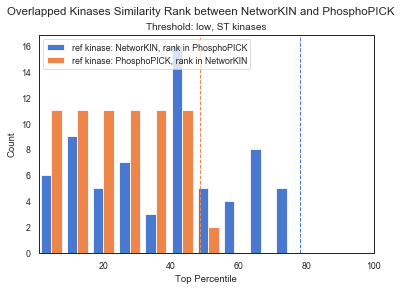

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


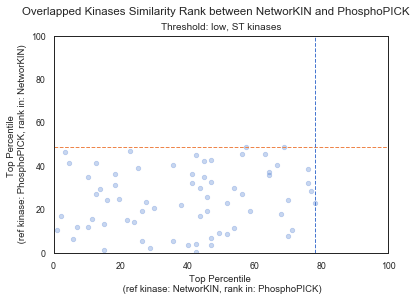

In [15]:
heatmap_y_m_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_PhosphoPICK_med_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_m_r, nw05_y_r, pp06_y_r , 'NetworKIN', 'PhosphoPICK' )
kin_rank_y_r.to_csv(random_rank_dir + 'med_Y_nw_pp.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'nw', 'pp', 'low', 'Y kinases', random_rank_dir)

heatmap_st_m_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_PhosphoPICK_med_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_m_r, nw05_st_r, pp06_st_r , 'NetworKIN', 'PhosphoPICK' )
kin_rank_st_r.to_csv(random_rank_dir + 'med_ST_nw_pp.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'nw', 'pp', 'low', 'ST kinases', random_rank_dir)


### NetworKIN(1) vs PhosphoPICK (0.02)
- index: kinases in NetworKIN
- column: kinases in PhosphoPICK

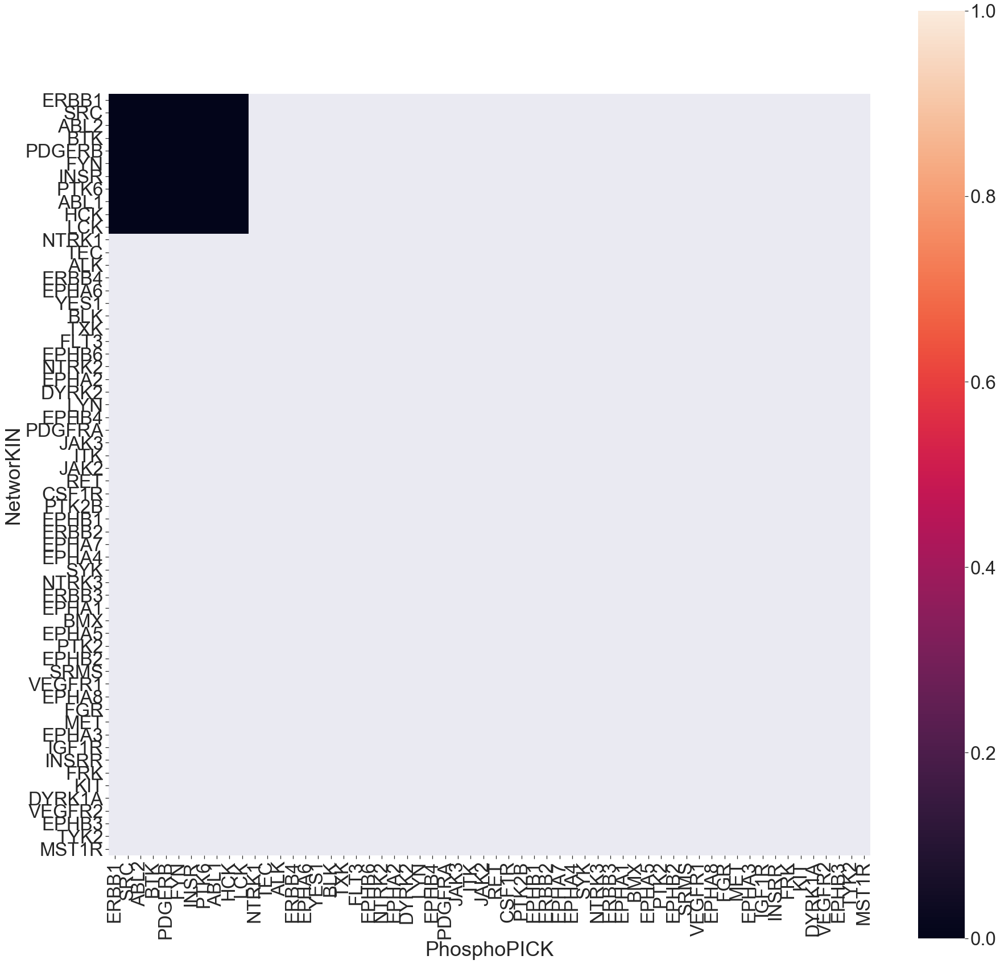

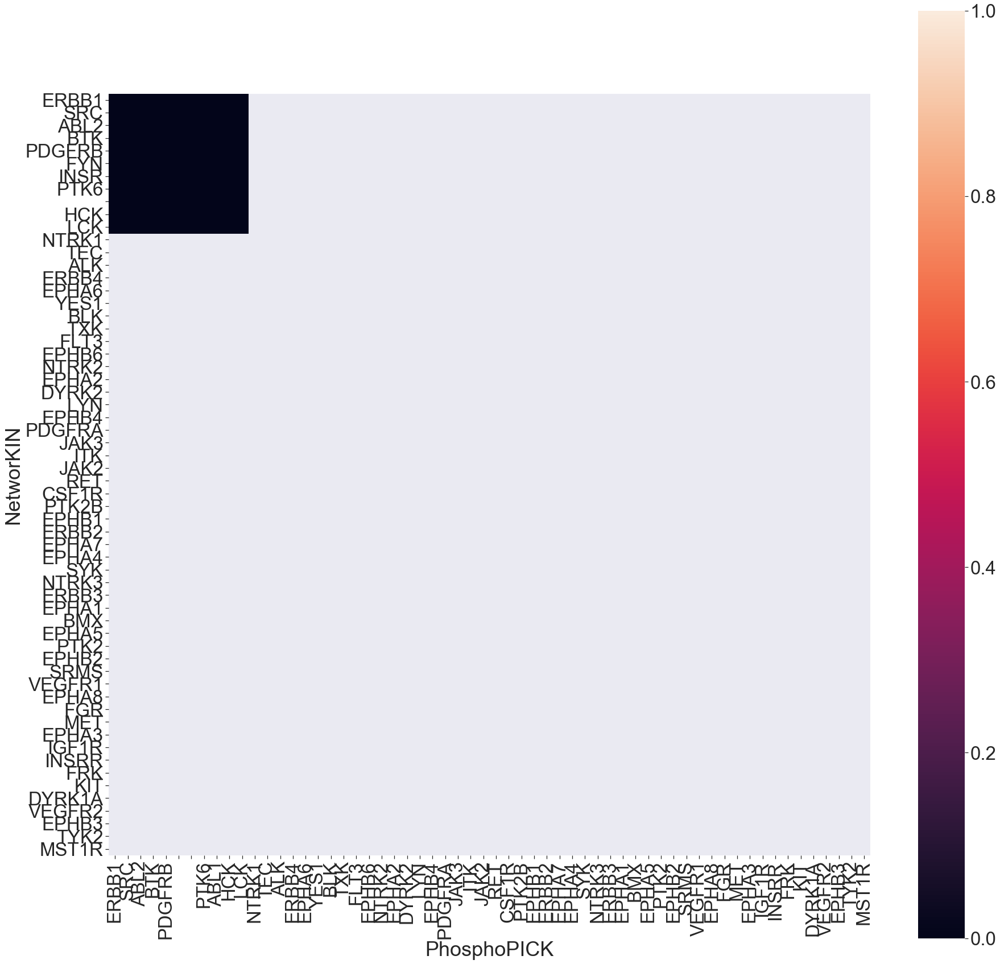

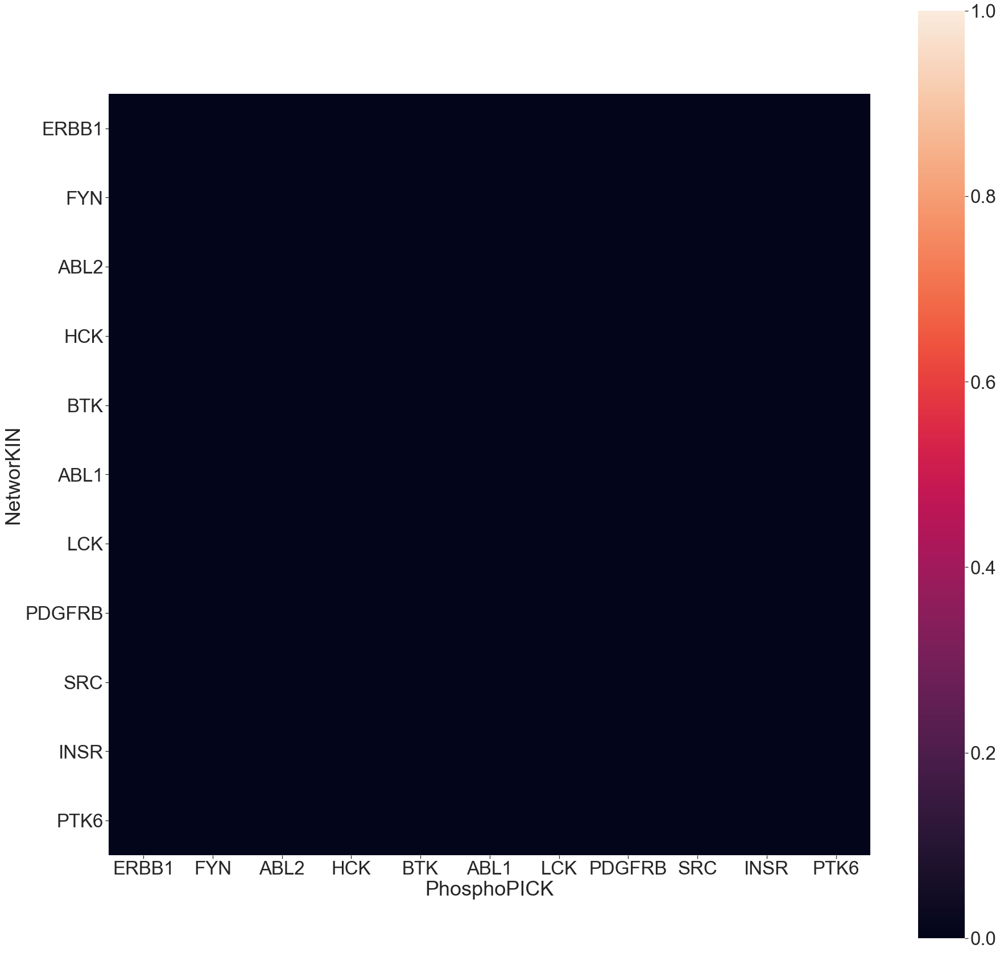

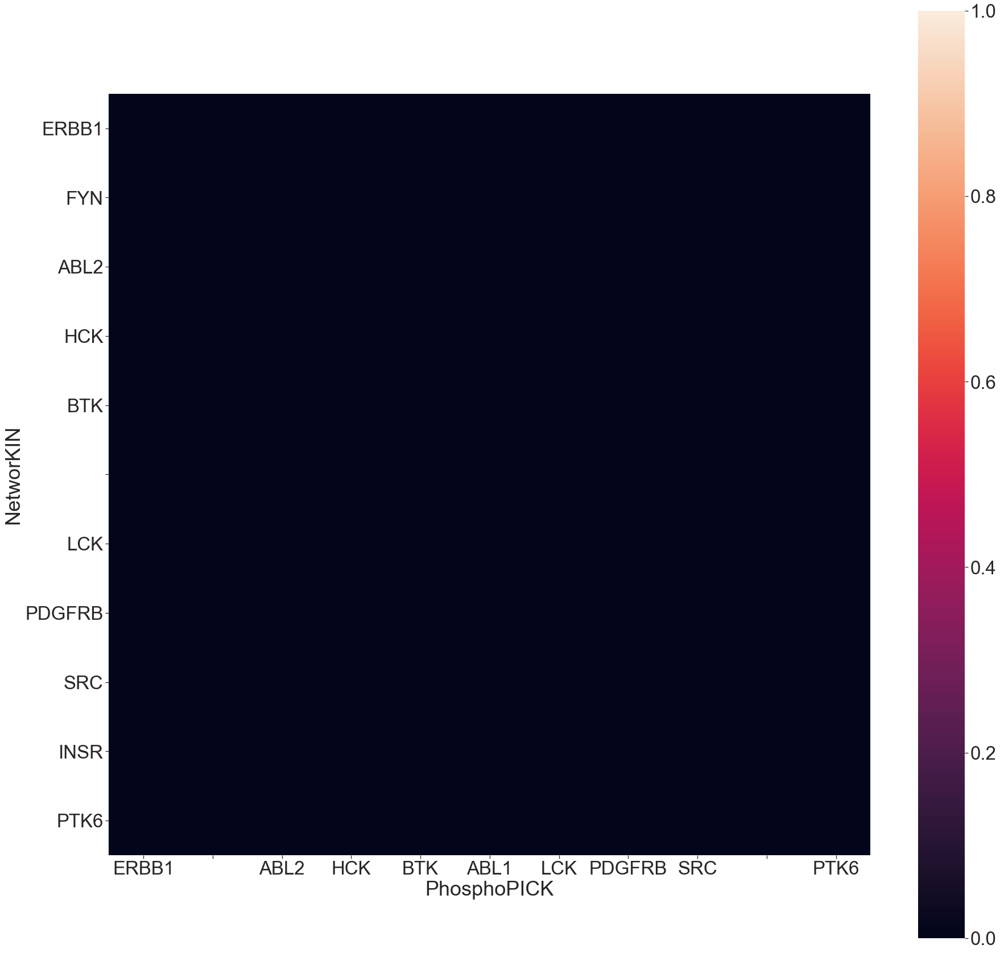

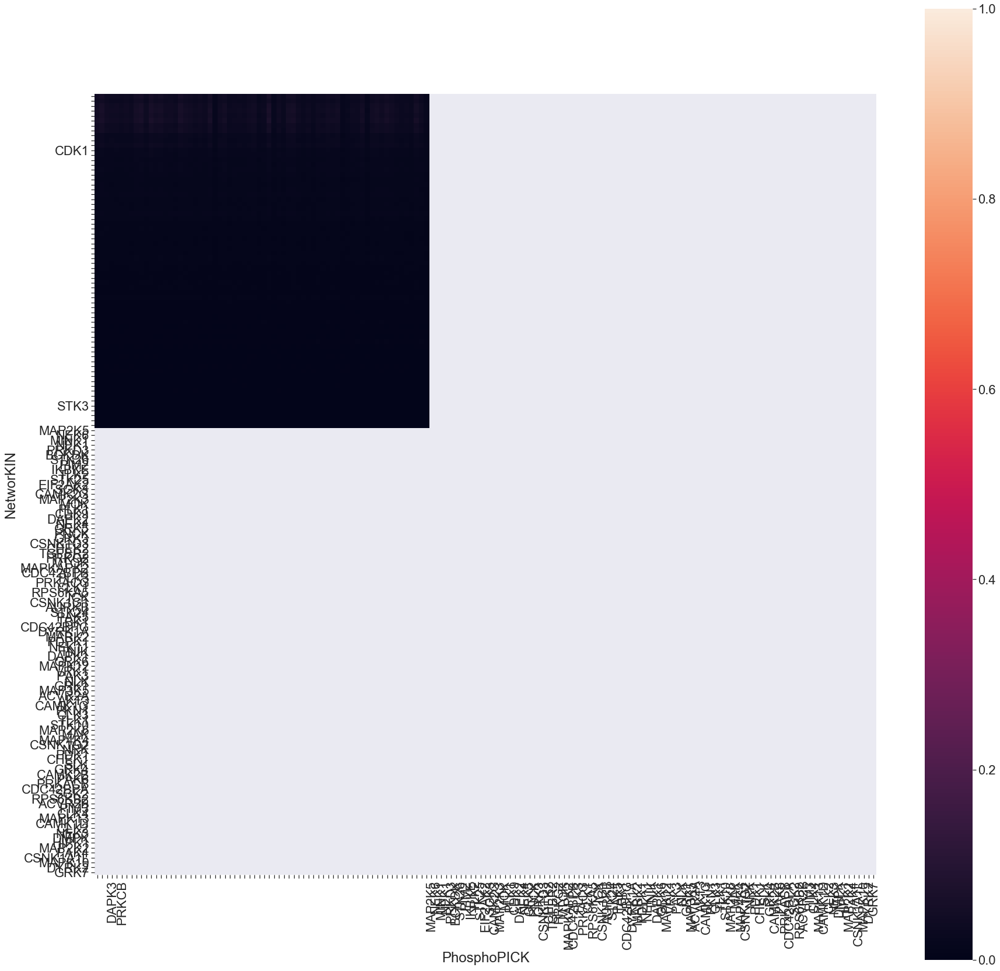

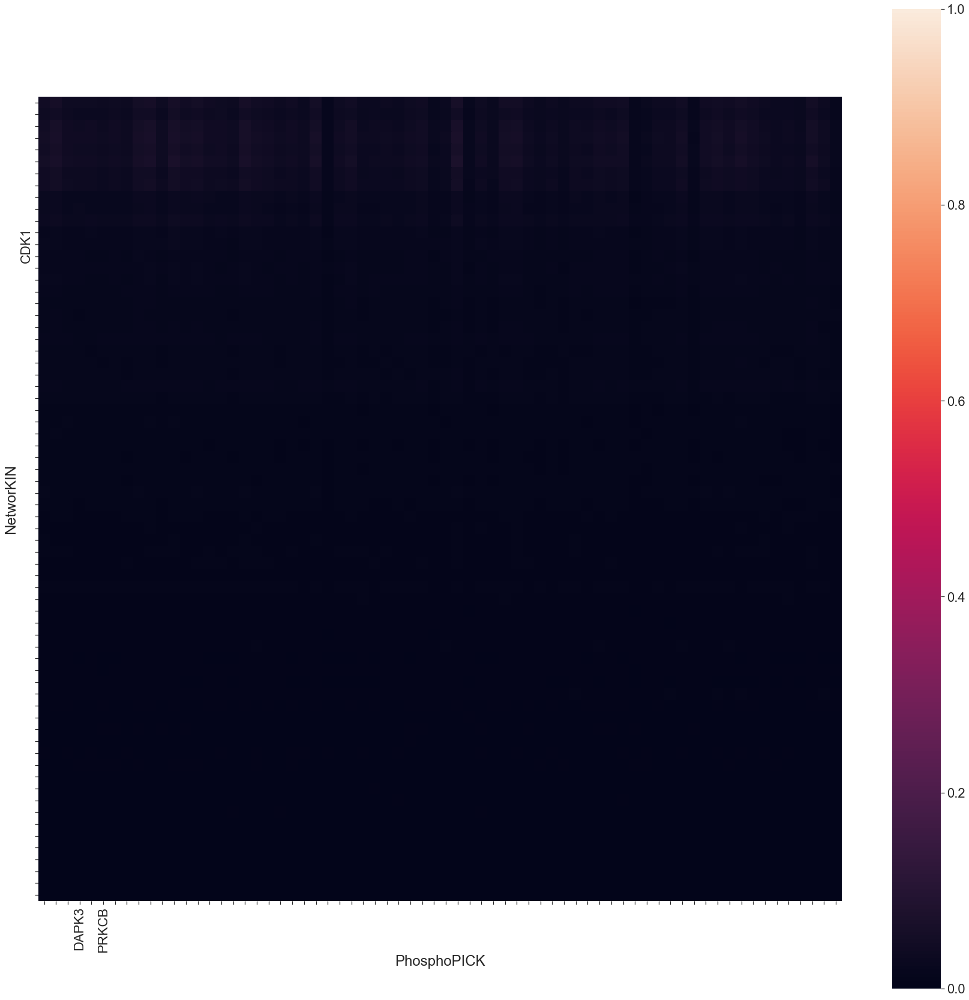

In [16]:
heatmap_y_h_r = kinase_mutual_information.between_predictors(nw1_y_r, pp02_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_PhosphoPICK_high_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_h_r, random_heatmap_dir  + 'NetworKIN_vs_PhosphoPICK_high_Y_kinase', 'NetworKIN', 'PhosphoPICK', 'y')

heatmap_st_h_r = kinase_mutual_information.between_predictors(nw1_st_r, pp02_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_PhosphoPICK_high_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_h_r, random_heatmap_dir + 'NetworKIN_vs_PhosphoPICK_high_ST_kinase', 'NetworKIN', 'PhosphoPICK', 'st')


11 overlapped kinases 
 NetworKIN :  50 kinases 
 PhosphoPICK :  21 kinases 



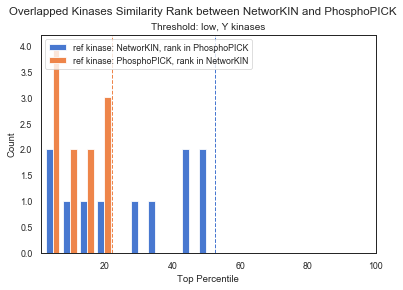

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


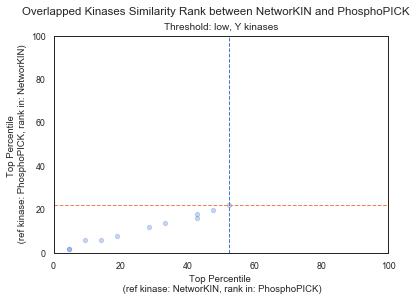

68 overlapped kinases 
 NetworKIN :  140 kinases 
 PhosphoPICK :  87 kinases 



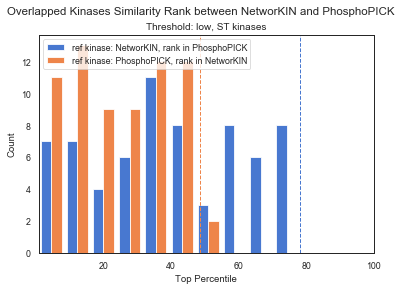

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


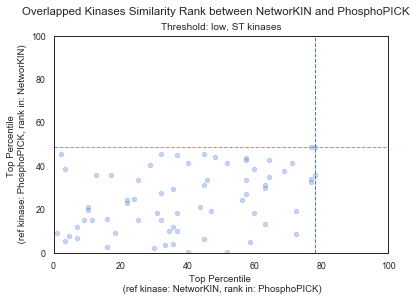

In [17]:
heatmap_y_h_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_PhosphoPICK_high_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_h_r, nw1_y_r, pp02_y_r , 'NetworKIN', 'PhosphoPICK' )
kin_rank_y_r.to_csv(random_rank_dir + 'high_Y_nw_pp.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'nw', 'pp', 'low', 'Y kinases', random_rank_dir)

heatmap_st_h_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_PhosphoPICK_high_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_h_r, nw1_st_r, pp02_st_r , 'NetworKIN', 'PhosphoPICK' )
kin_rank_st_r.to_csv(random_rank_dir + 'high_ST_nw_pp.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'nw', 'pp', 'low', 'ST kinases', random_rank_dir)


### NetworKIN(0.3) vs GPS (low) 
- index: kinases in NetworKIN
- column: kinases in GPS

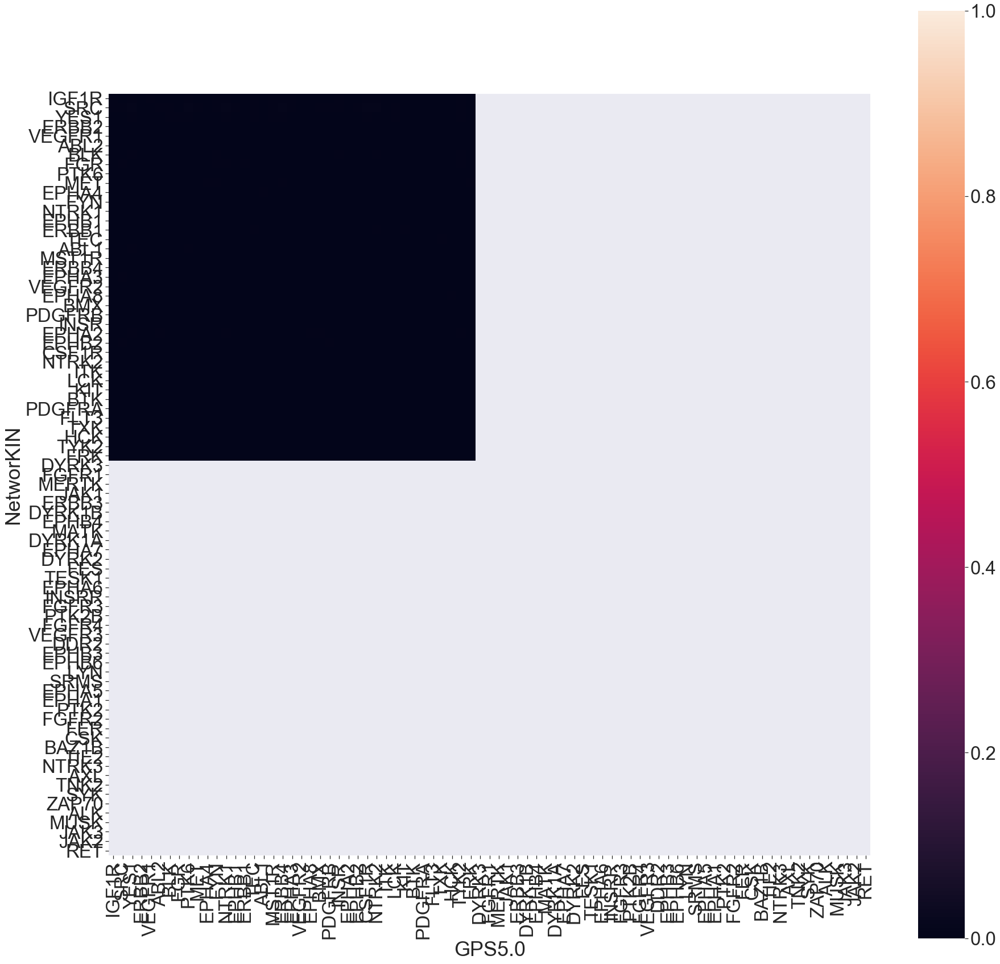

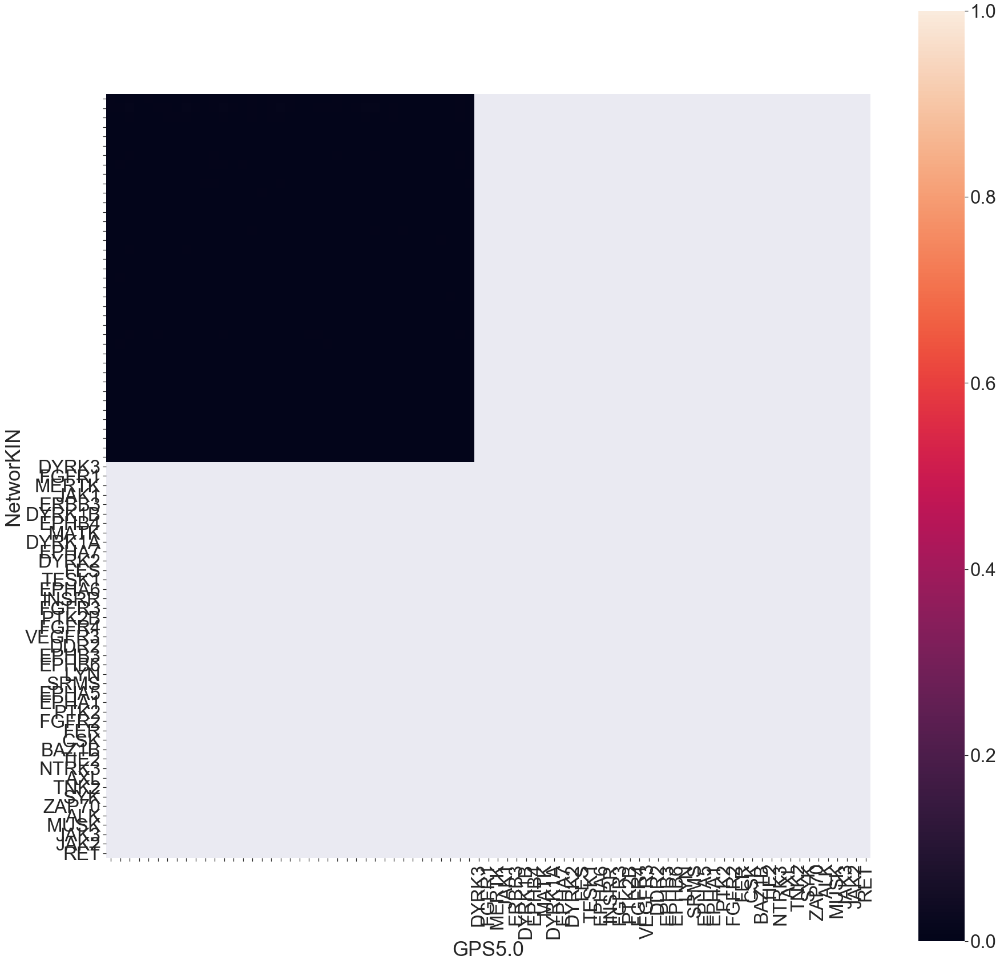

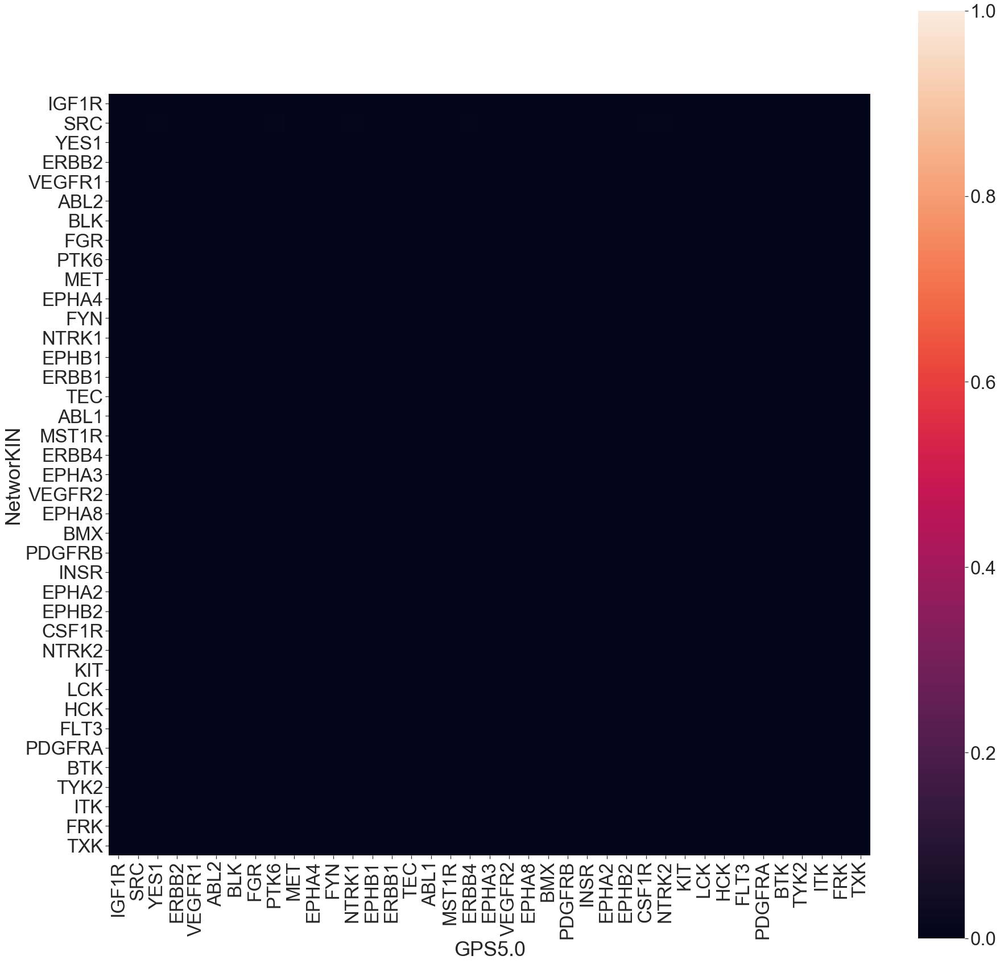

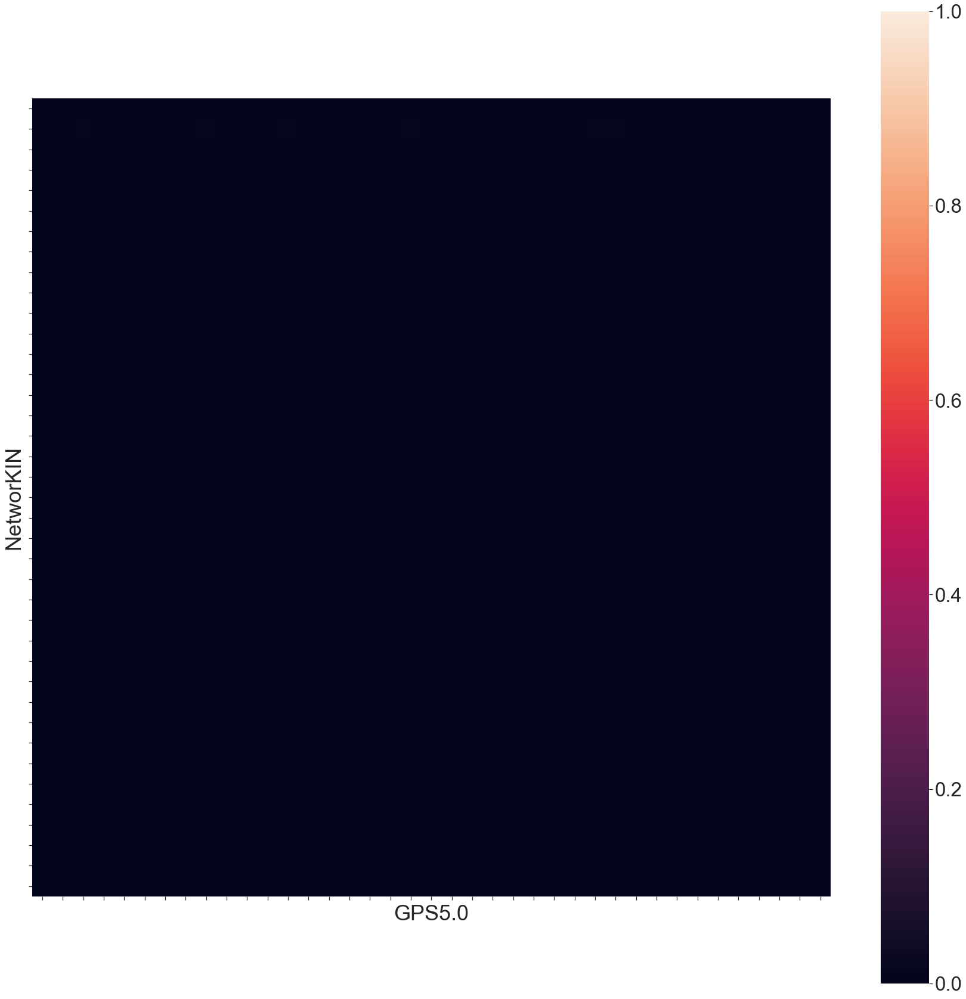

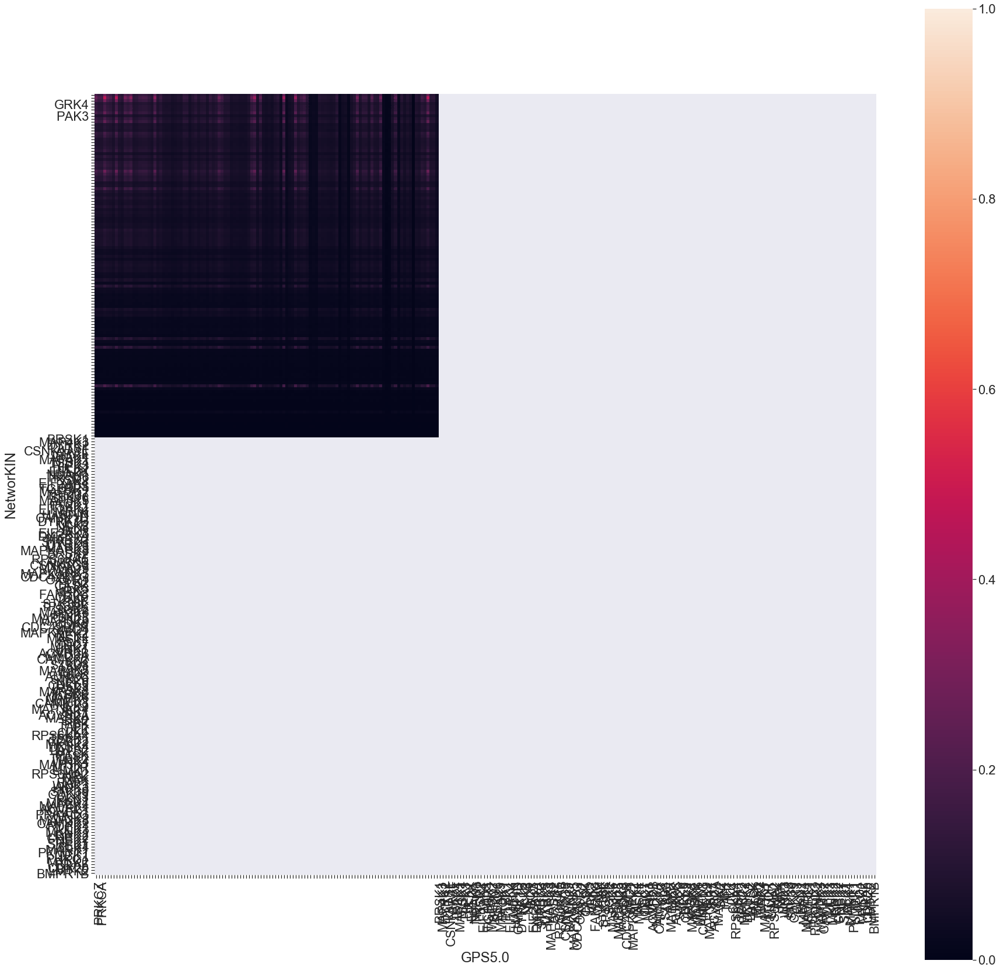

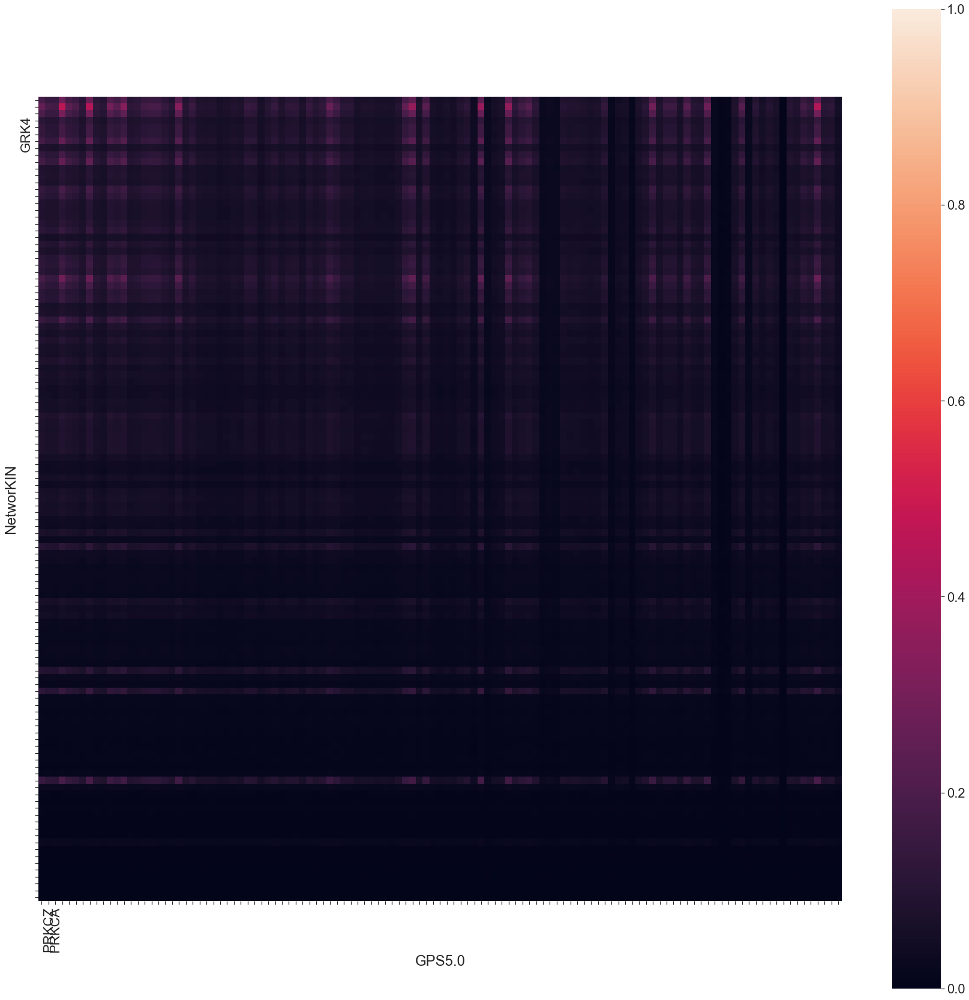

In [18]:
heatmap_y_l_r = kinase_mutual_information.between_predictors(nw03_y_r, gpsl_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_GPS5.0_low_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_l_r, random_heatmap_dir  + 'NetworKIN_vs_GPS5.0_low_Y_kinase', 'NetworKIN', 'GPS5.0', 'y')

heatmap_st_l_r = kinase_mutual_information.between_predictors(nw03_st_r, gpsl_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_GPS5.0_low_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_l_r, random_heatmap_dir + 'NetworKIN_vs_GPS5.0_low_ST_kinase', 'NetworKIN', 'GPS5.0', 'st')


39 overlapped kinases 
 NetworKIN :  50 kinases 
 GPS :  70 kinases 



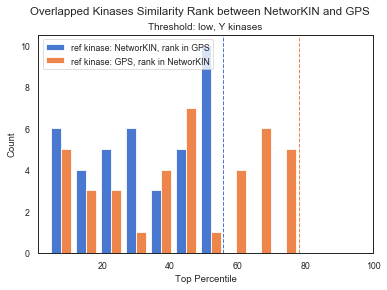

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


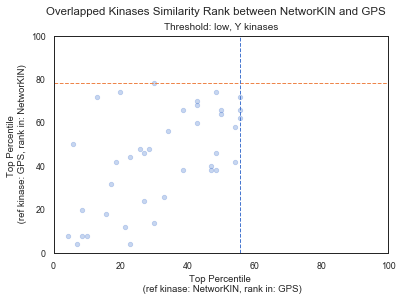

117 overlapped kinases 
 NetworKIN :  140 kinases 
 GPS :  243 kinases 



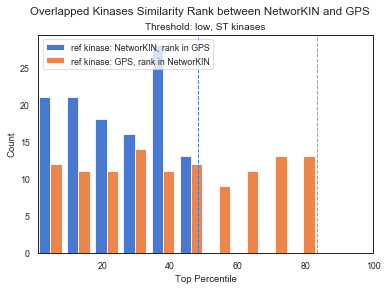

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


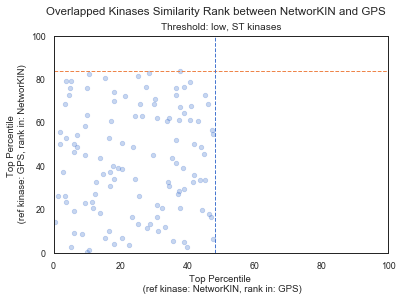

In [21]:
heatmap_y_l_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_GPS5.0_low_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_l_r, nw03_y_r, gpsl_y_r , 'NetworKIN', 'GPS' )
kin_rank_y_r.to_csv(random_rank_dir + 'low_Y_nw_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'nw', 'gps', 'low', 'Y kinases', random_rank_dir)

heatmap_st_l_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_GPS5.0_low_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_l_r, nw03_st_r, gpsl_st_r , 'NetworKIN', 'GPS' )
kin_rank_st_r.to_csv(random_rank_dir + 'low_ST_nw_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'nw', 'gps', 'low', 'ST kinases', random_rank_dir)


### NetworKIN(0.5) vs GPS (medium) 
- index: kinases in NetworKIN
- column: kinases in GPS

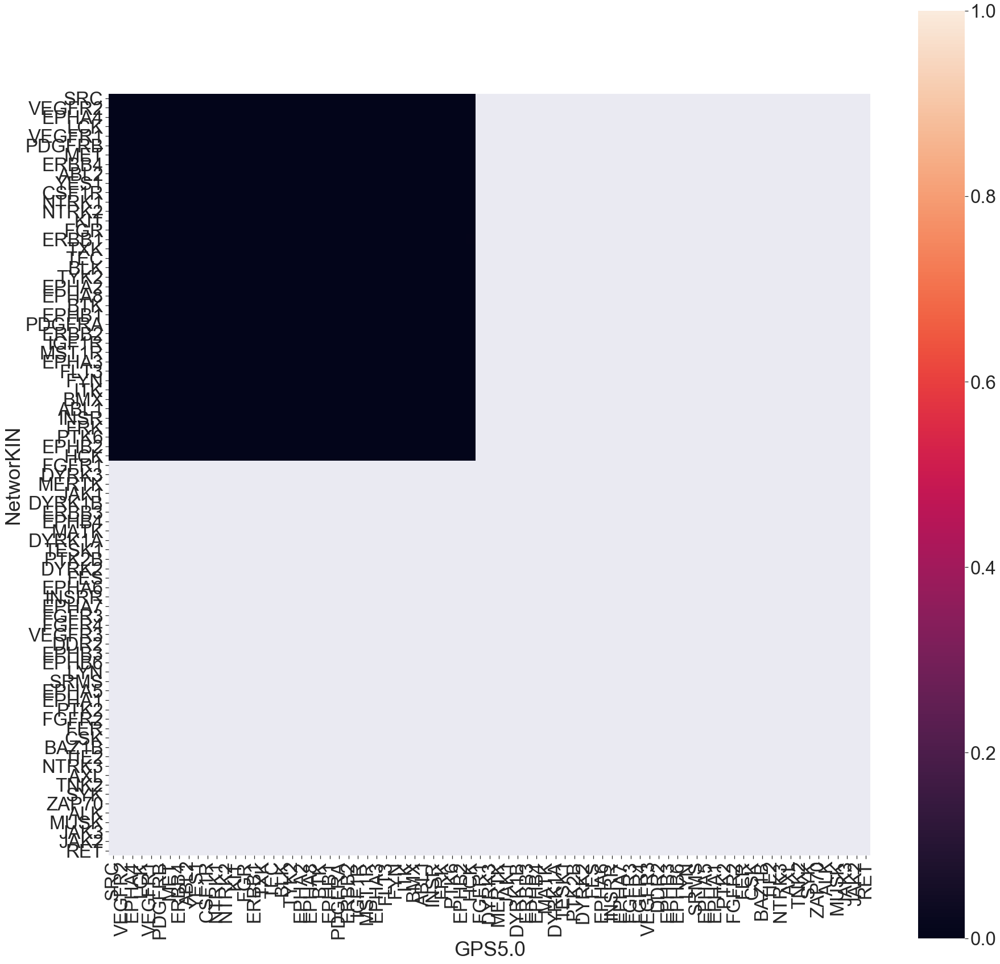

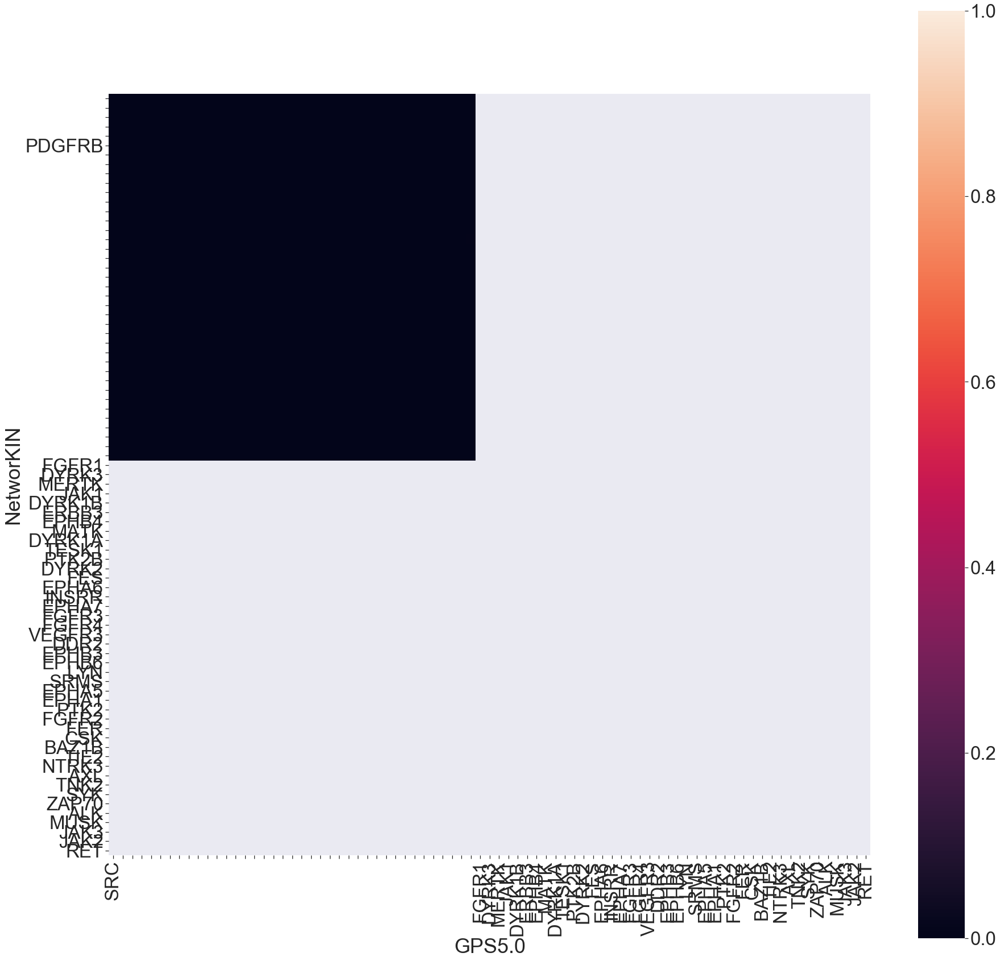

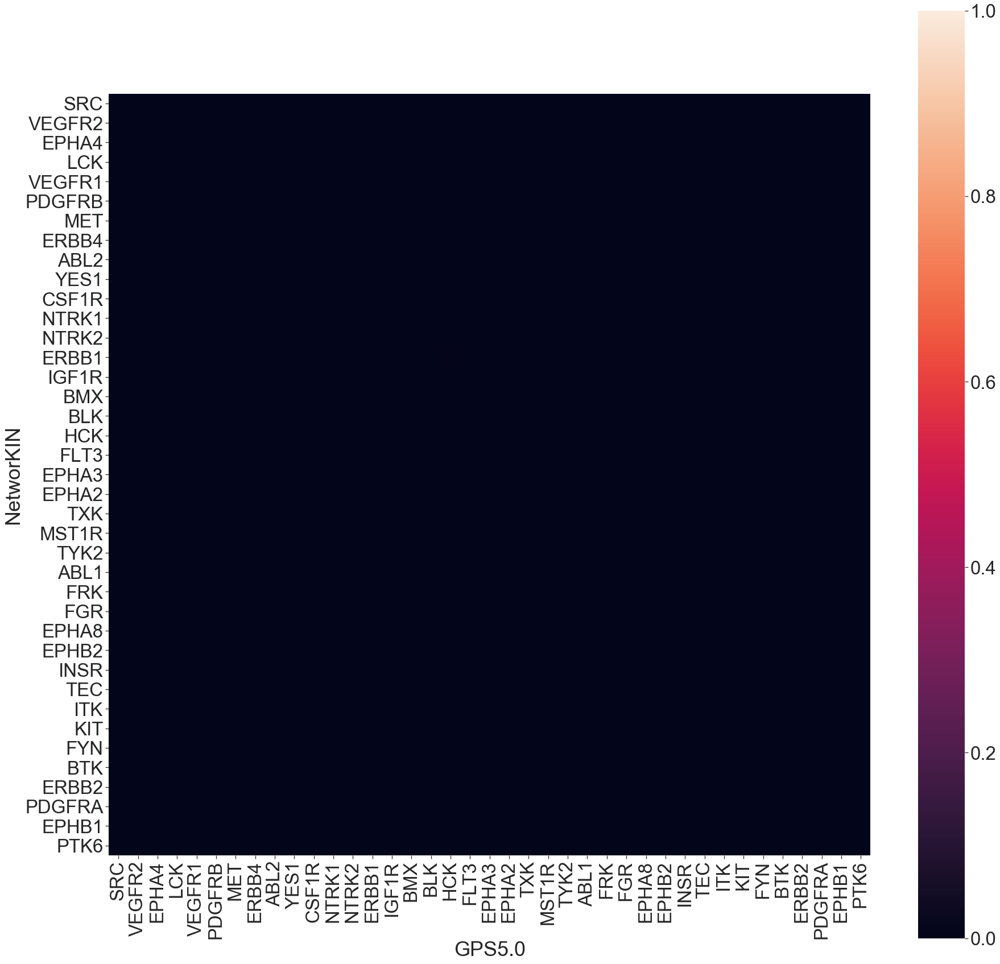

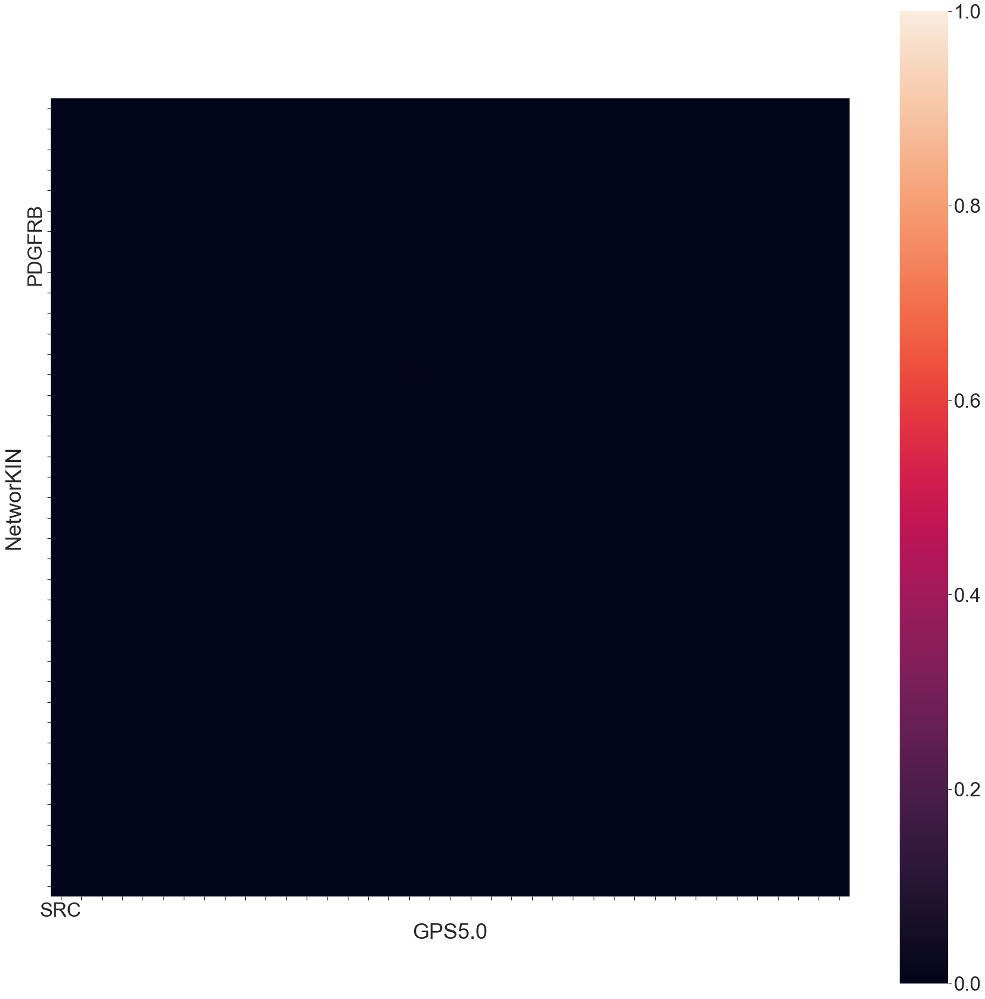

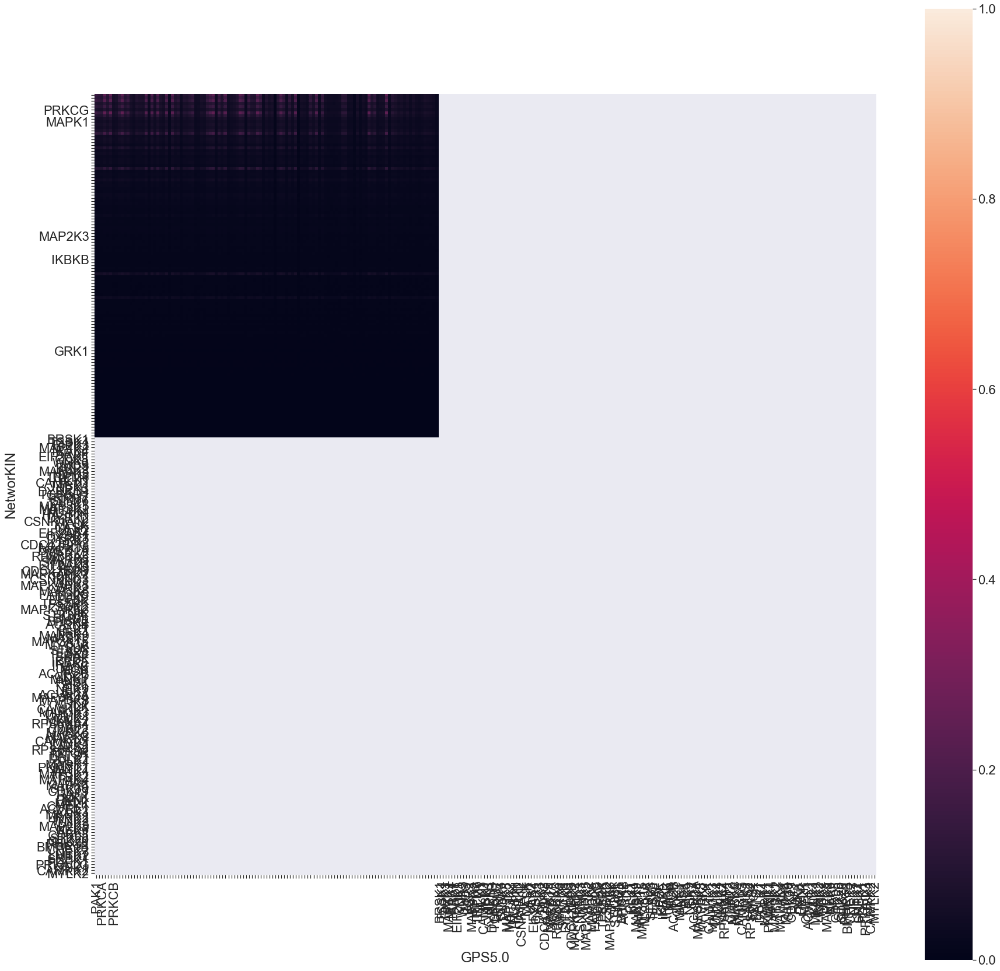

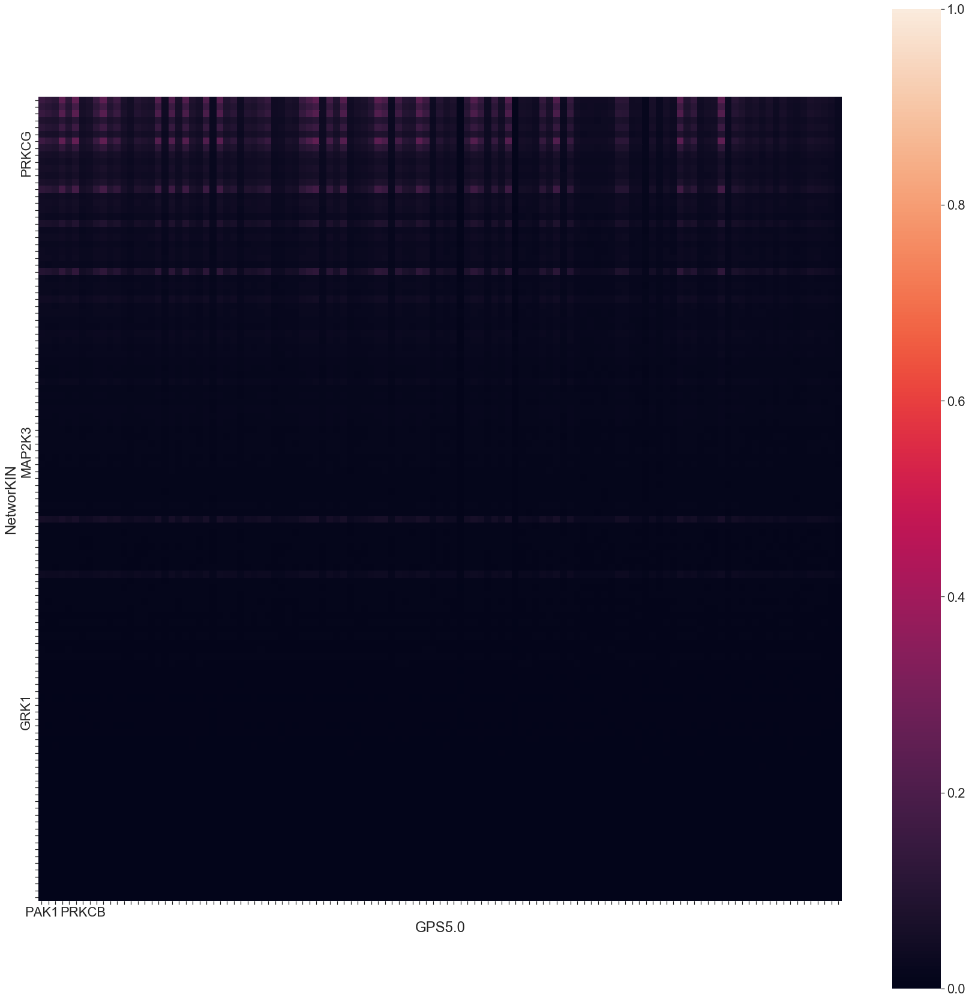

In [22]:
heatmap_y_m_r = kinase_mutual_information.between_predictors(nw05_y_r, gpsm_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_GPS5.0_med_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_m_r, random_heatmap_dir  + 'NetworKIN_vs_GPS5.0_med_Y_kinase', 'NetworKIN', 'GPS5.0', 'y')

heatmap_st_m_r = kinase_mutual_information.between_predictors(nw05_st_r, gpsm_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_GPS5.0_med_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_m_r, random_heatmap_dir + 'NetworKIN_vs_GPS5.0_med_ST_kinase', 'NetworKIN', 'GPS5.0', 'st')


39 overlapped kinases 
 NetworKIN :  50 kinases 
 GPS :  70 kinases 



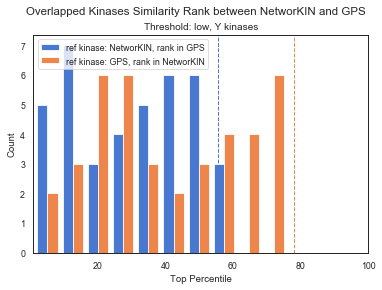

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


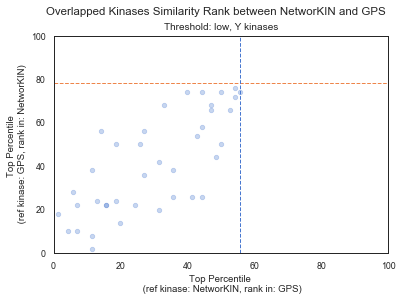

117 overlapped kinases 
 NetworKIN :  140 kinases 
 GPS :  243 kinases 



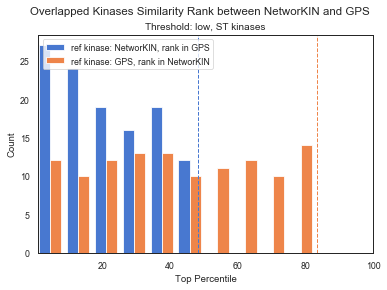

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


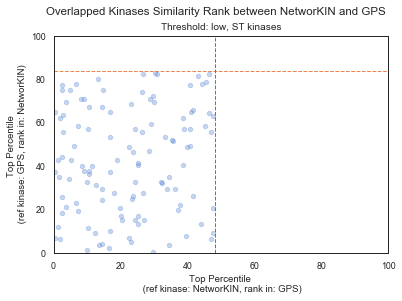

In [23]:
heatmap_y_m_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_GPS5.0_med_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_m_r, nw05_y_r, gpsm_y_r , 'NetworKIN', 'GPS' )
kin_rank_y_r.to_csv(random_rank_dir + 'med_Y_nw_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'nw', 'gps', 'low', 'Y kinases', random_rank_dir)

heatmap_st_m_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_GPS5.0_med_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_m_r, nw05_st_r, gpsm_st_r , 'NetworKIN', 'GPS' )
kin_rank_st_r.to_csv(random_rank_dir + 'med_ST_nw_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'nw', 'gps', 'low', 'ST kinases', random_rank_dir)


### NetworKIN(1) vs GPS (high) 
- index: kinases in NetworKIN
- column: kinases in GPS

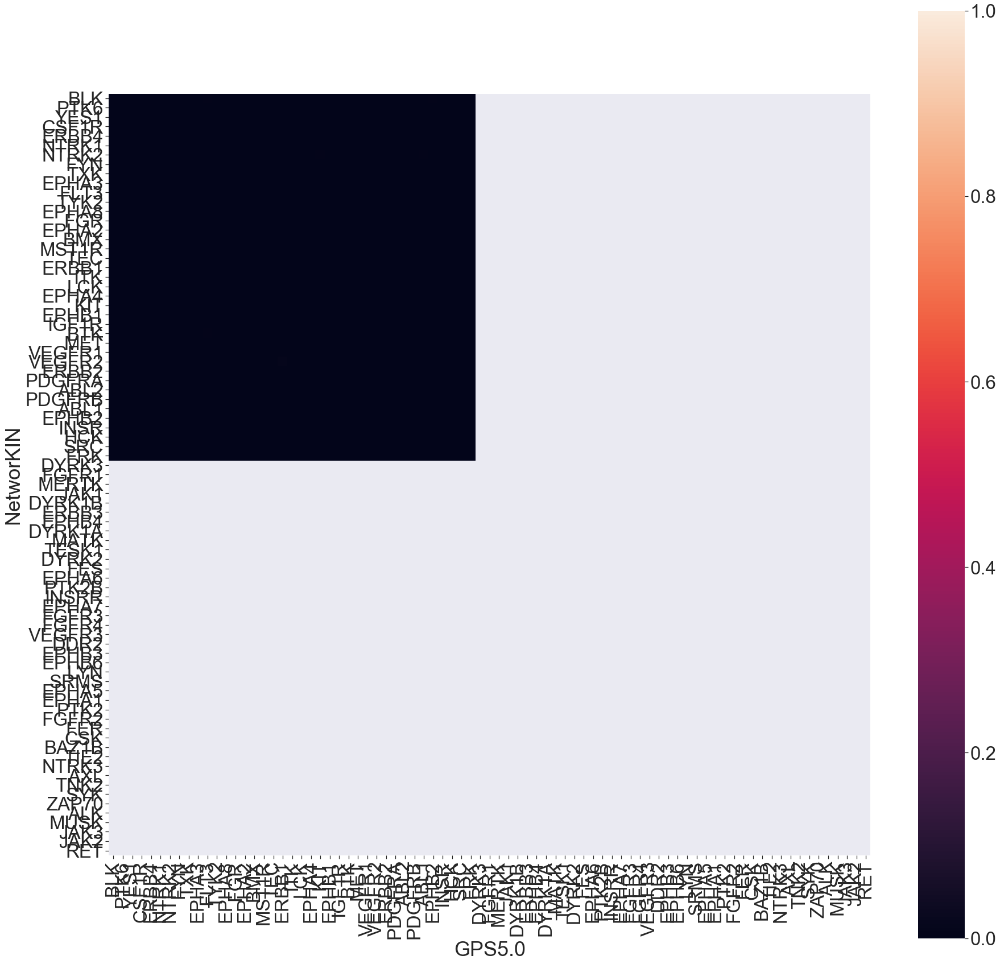

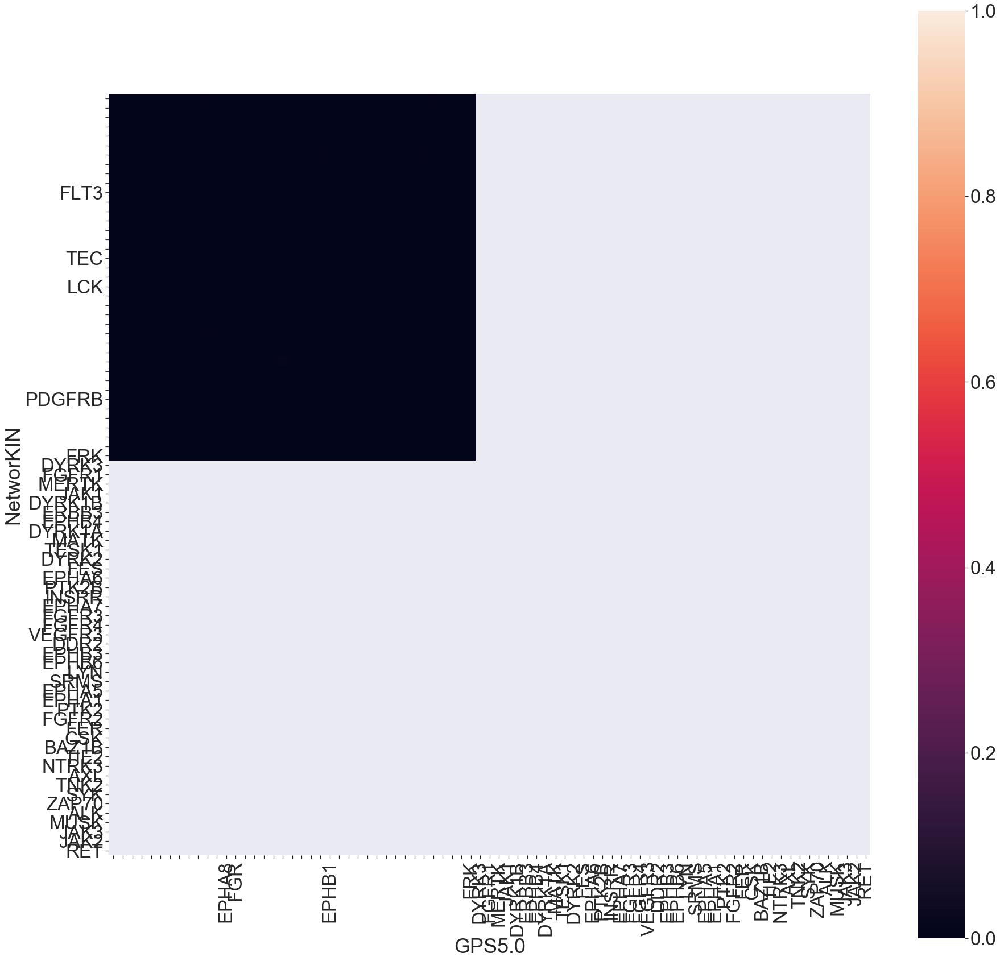

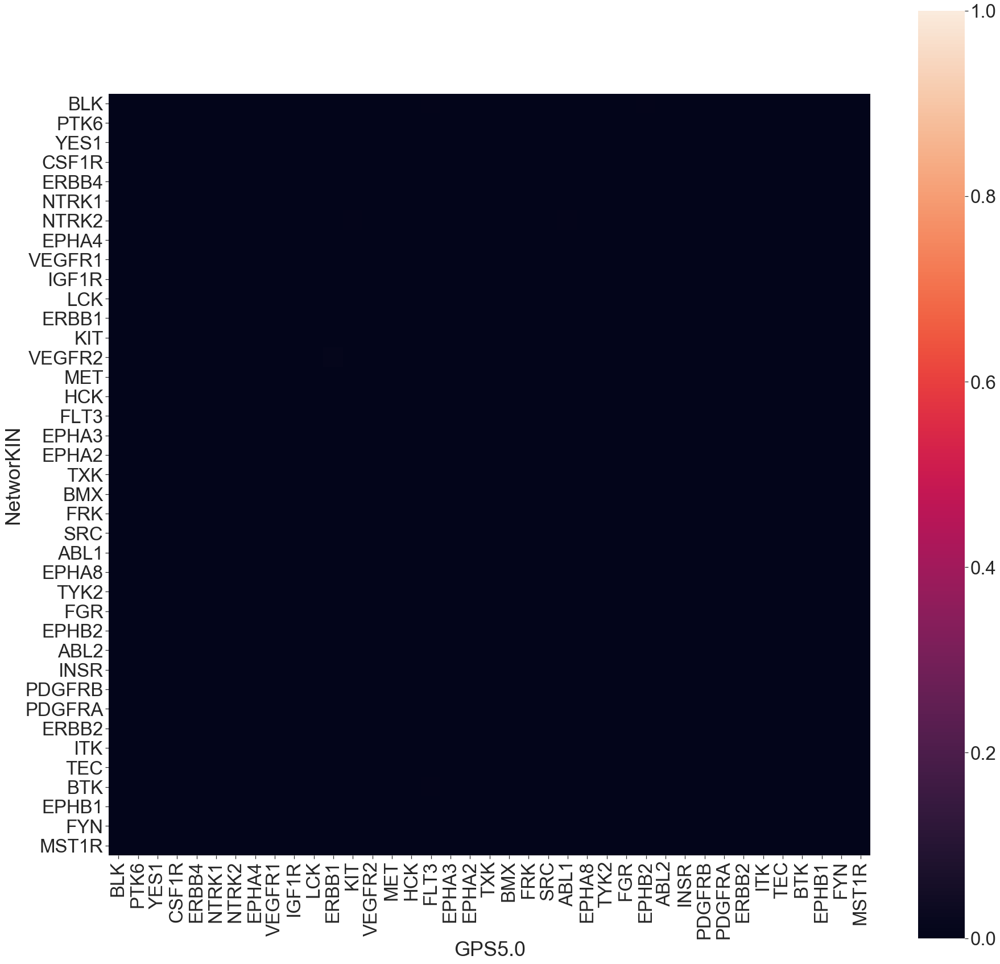

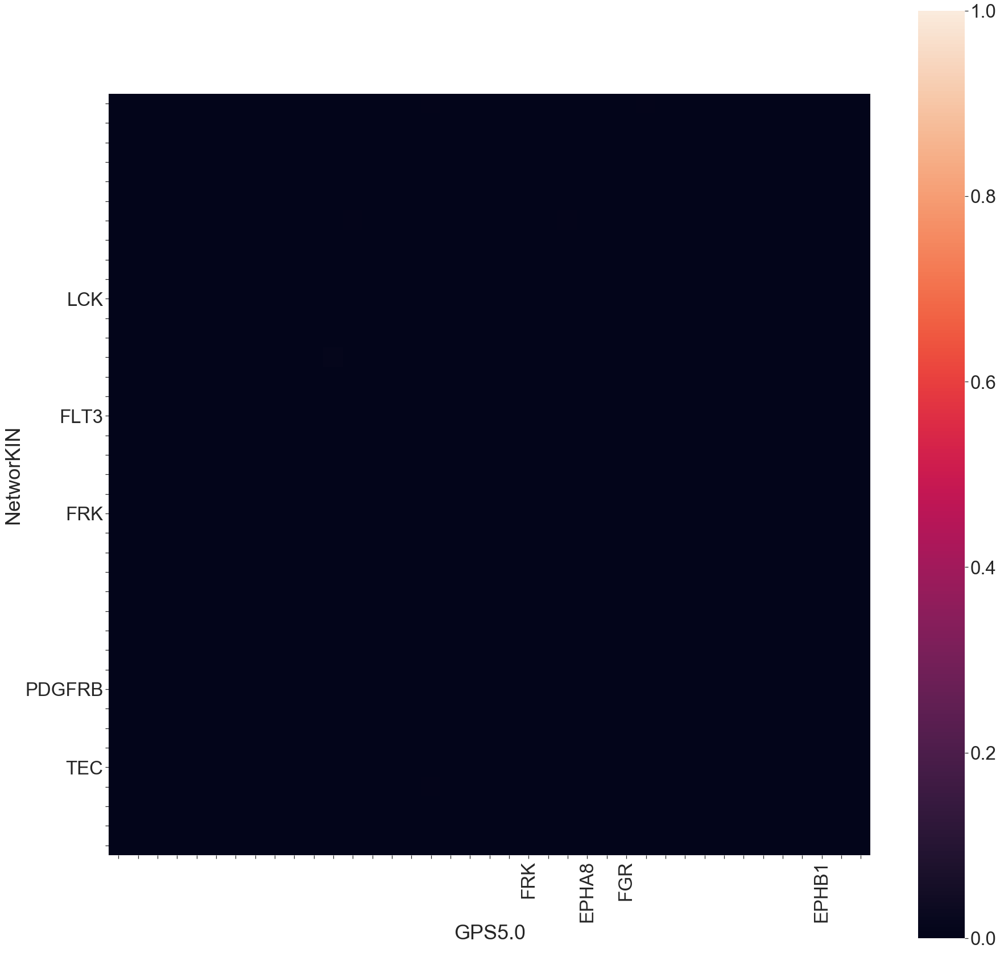

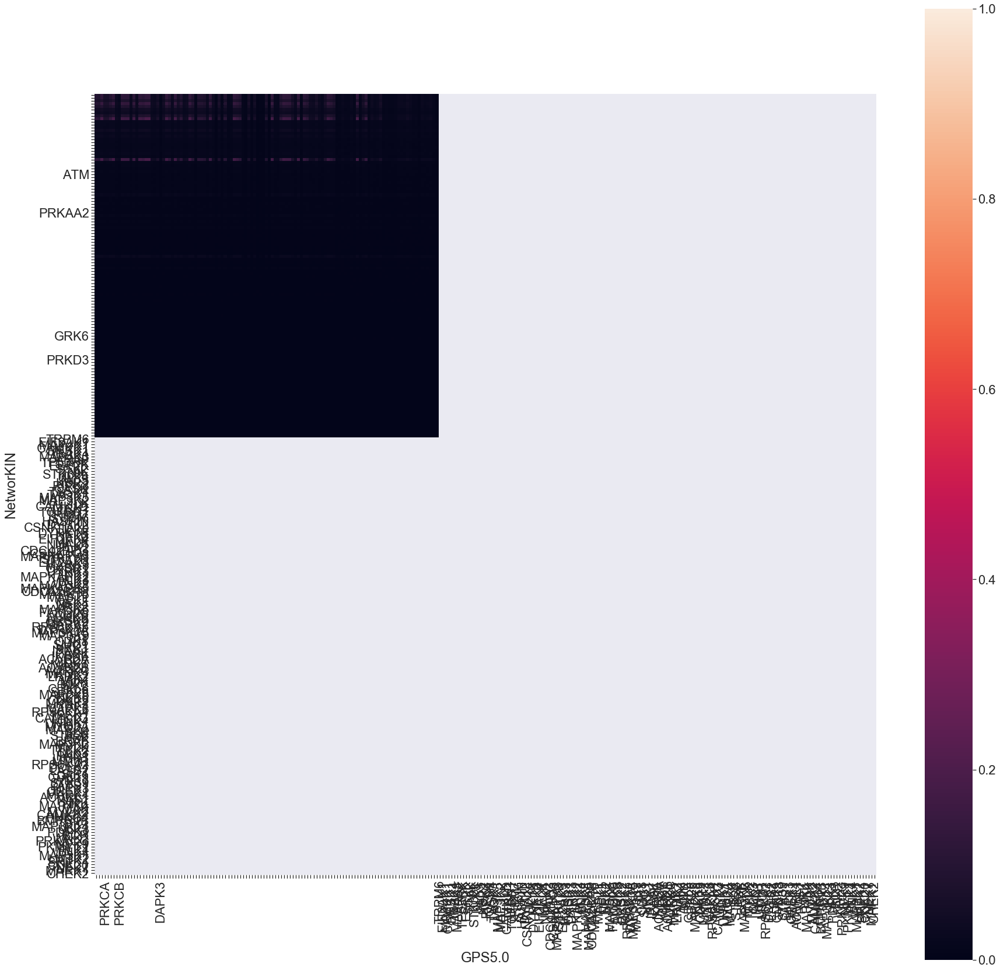

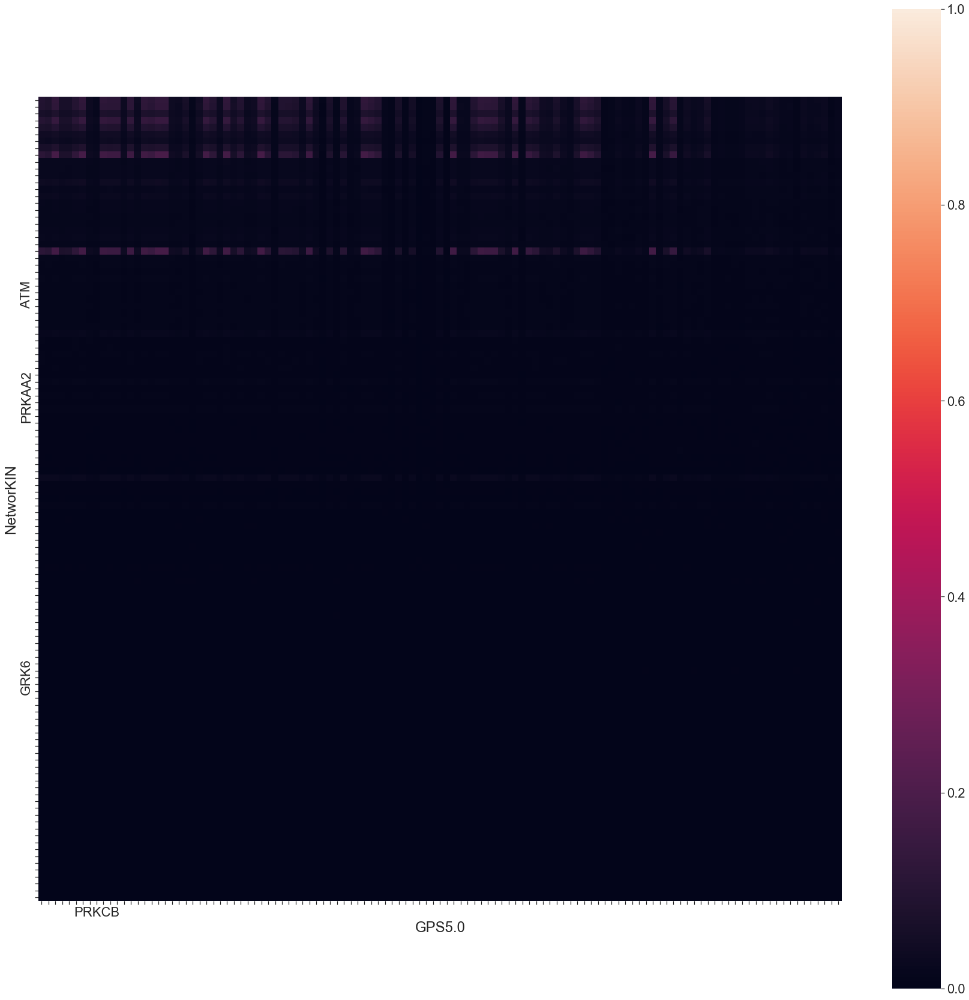

In [24]:
heatmap_y_h_r = kinase_mutual_information.between_predictors(nw1_y_r, gpsh_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_GPS5.0_high_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_h_r, random_heatmap_dir  + 'NetworKIN_vs_GPS5.0_high_Y_kinase', 'NetworKIN', 'GPS5.0', 'y')

heatmap_st_h_r = kinase_mutual_information.between_predictors(nw1_st_r, gpsh_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'NetworKIN_vs_GPS5.0_high_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_h_r, random_heatmap_dir + 'NetworKIN_vs_GPS5.0_high_ST_kinase', 'NetworKIN', 'GPS5.0', 'st')


39 overlapped kinases 
 NetworKIN :  50 kinases 
 GPS :  70 kinases 



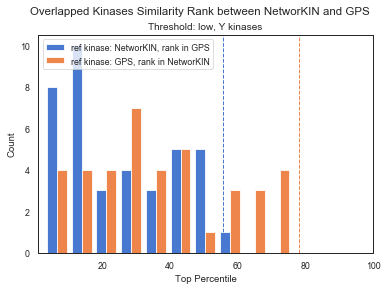

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


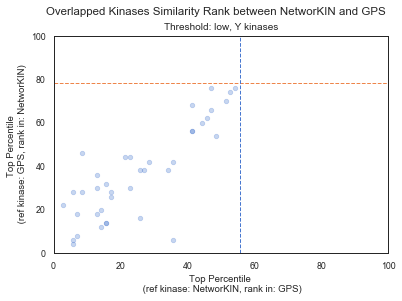

117 overlapped kinases 
 NetworKIN :  140 kinases 
 GPS :  243 kinases 



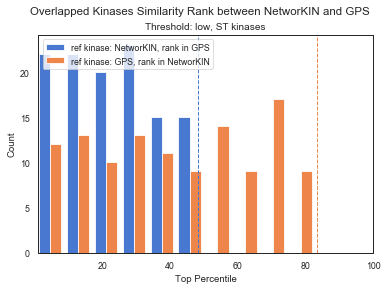

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


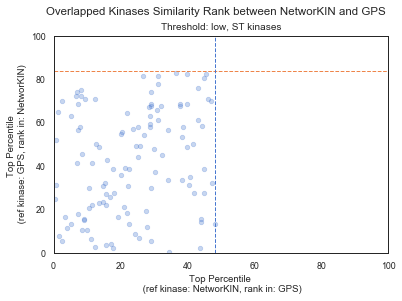

In [25]:
heatmap_y_h_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_GPS5.0_high_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_h_r, nw1_y_r, gpsh_y_r , 'NetworKIN', 'GPS' )
kin_rank_y_r.to_csv(random_rank_dir + 'high_Y_nw_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'nw', 'gps', 'low', 'Y kinases', random_rank_dir)

heatmap_st_h_r = pd.read_csv(random_df_dir + 'NetworKIN_vs_GPS5.0_high_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_h_r, nw1_st_r, gpsh_st_r , 'NetworKIN', 'GPS' )
kin_rank_st_r.to_csv(random_rank_dir + 'high_ST_nw_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'nw', 'gps', 'low', 'ST kinases', random_rank_dir)


### PhosphoPICK vs GPS (low)
- index: kinases in PhosphoPICK
- column: kinases in GPS

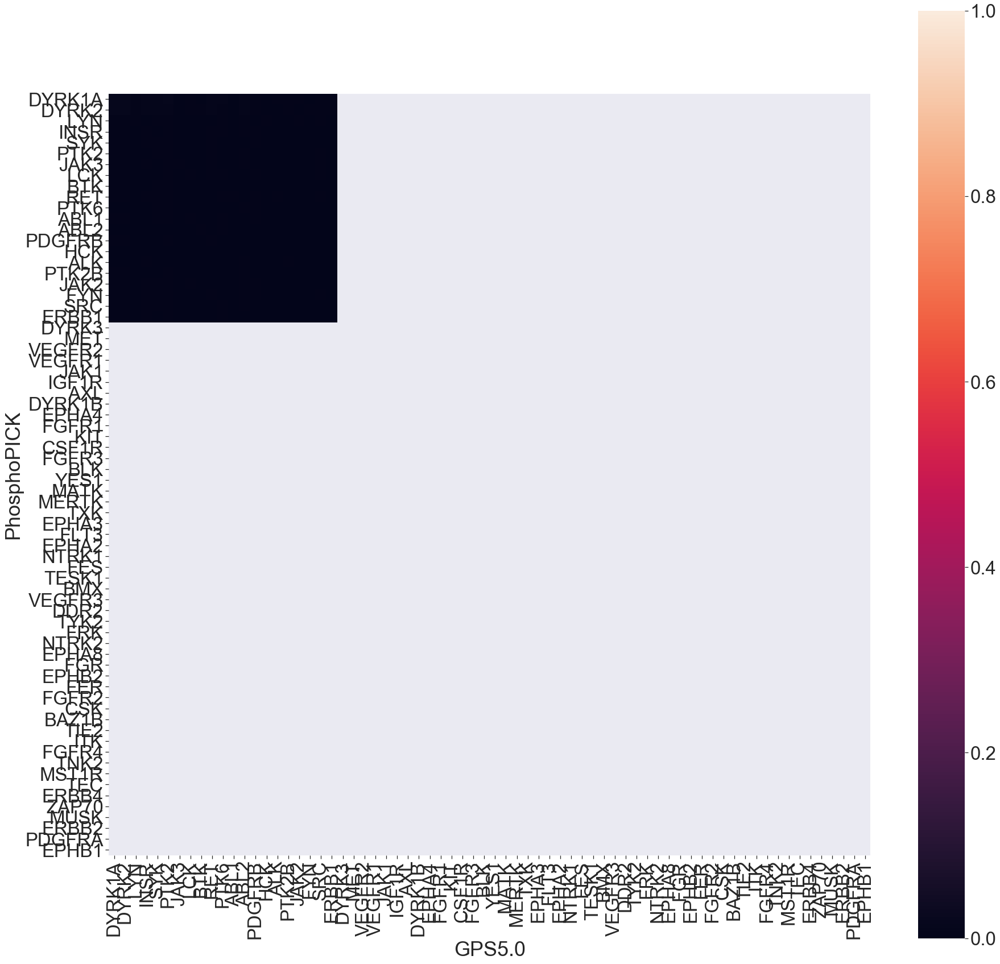

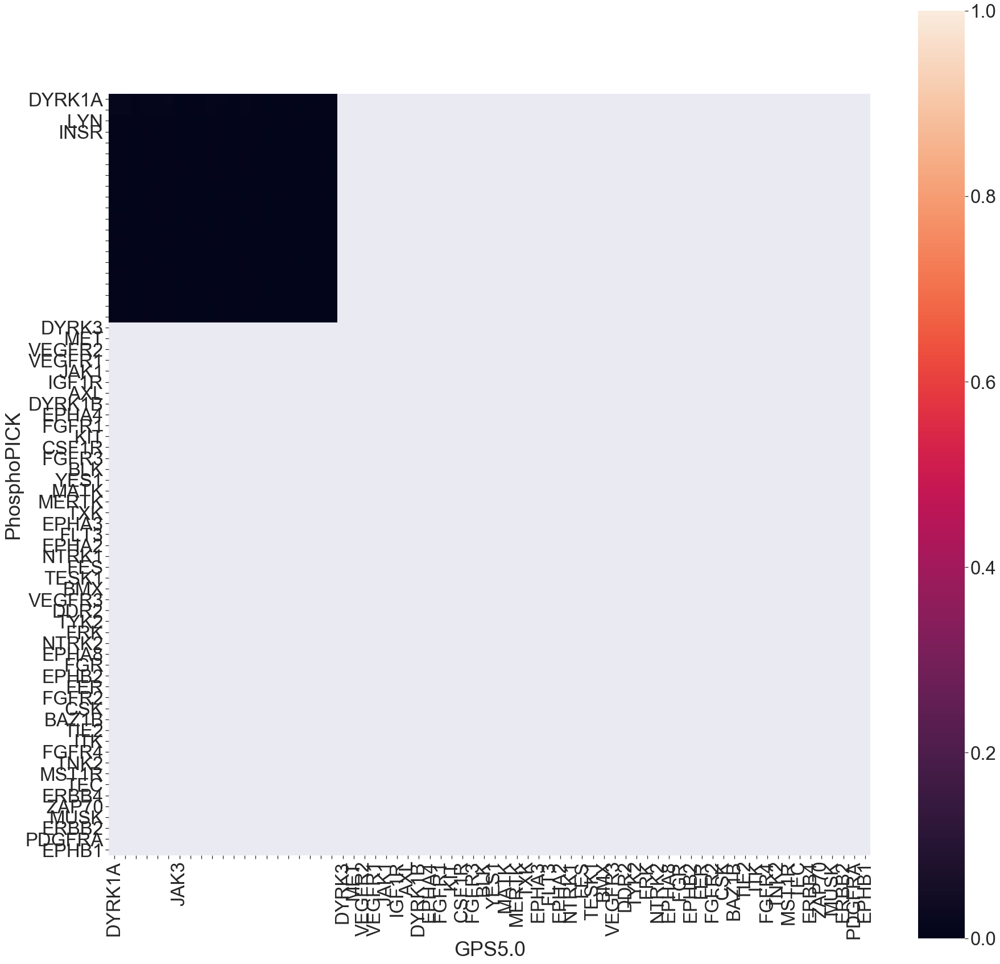

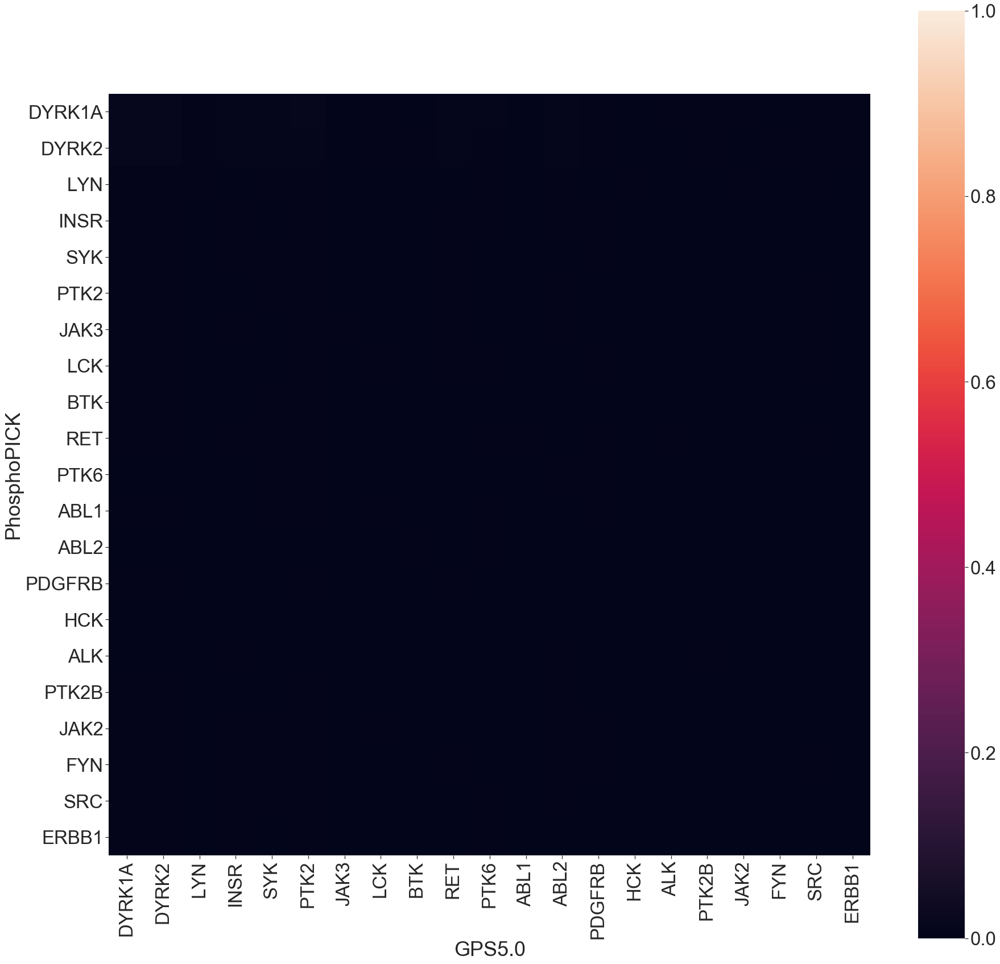

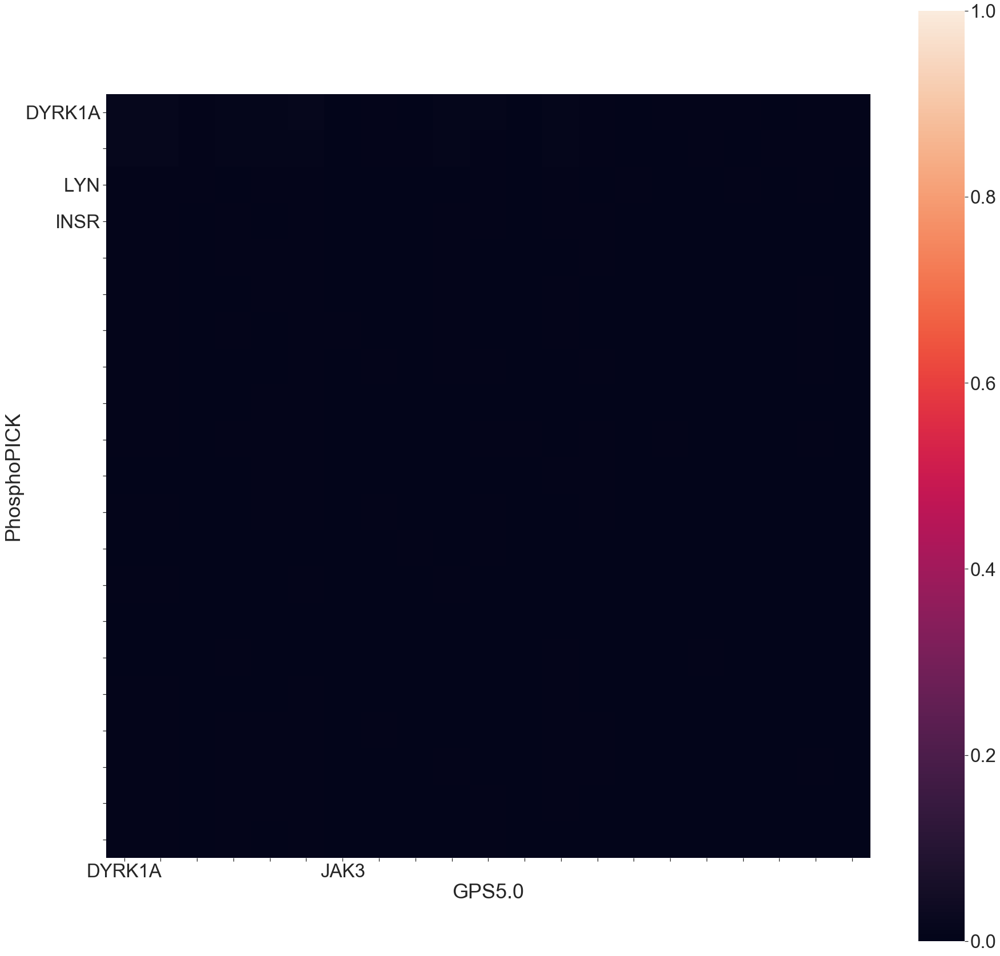

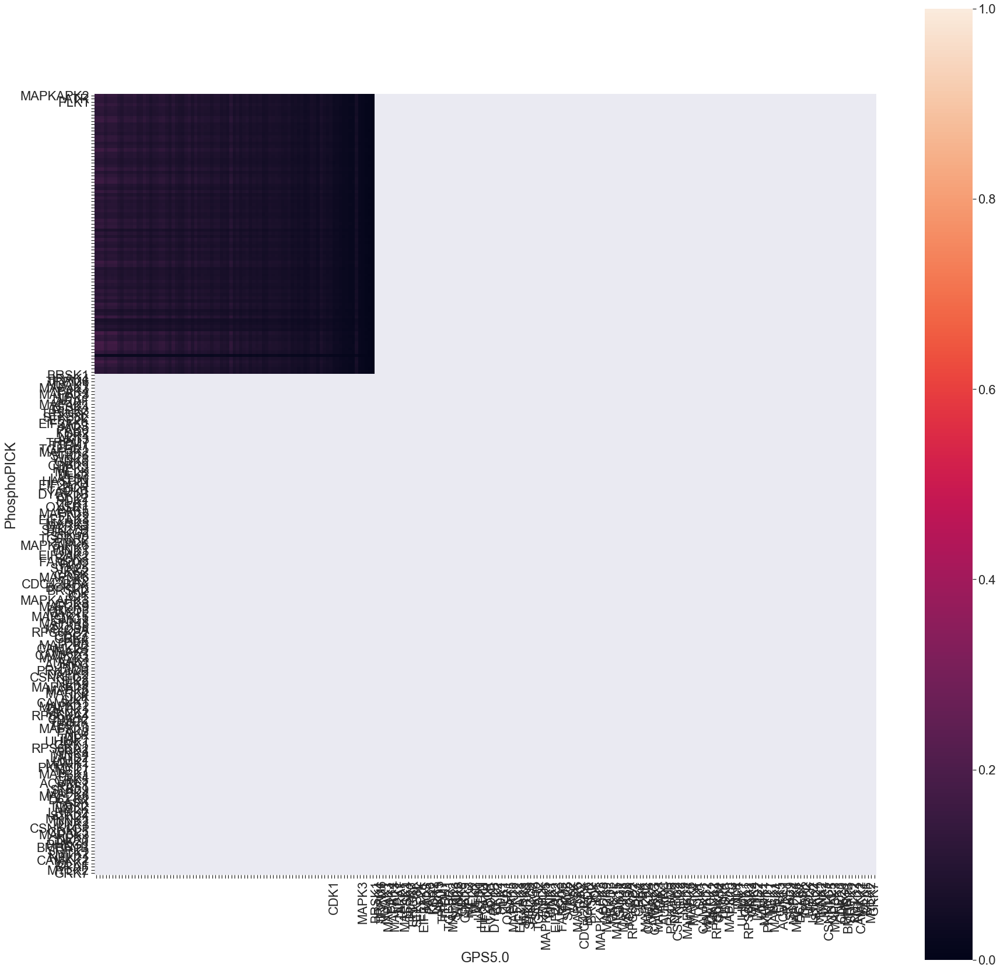

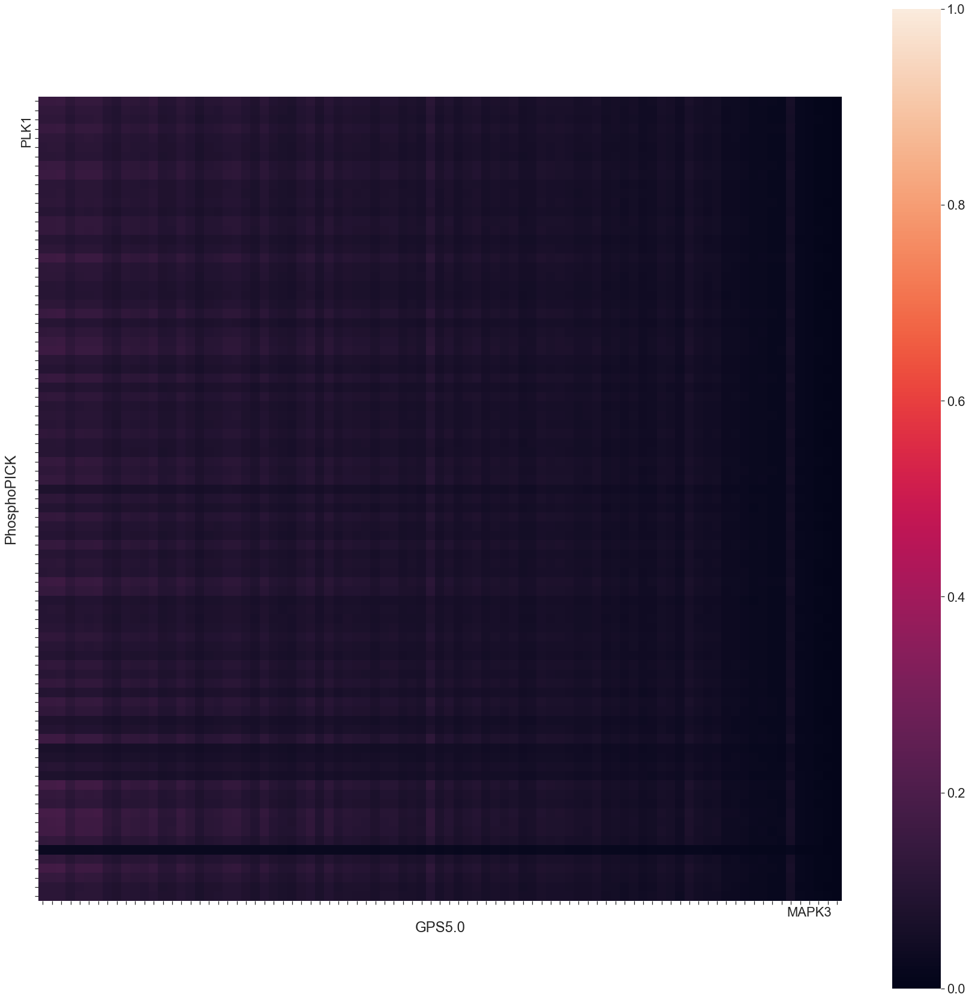

In [26]:
heatmap_y_l_r = kinase_mutual_information.between_predictors(pp1_y_r, gpsl_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'PhosphoPICK_vs_GPS5.0_low_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_l_r, random_heatmap_dir  + 'PhosphoPICK_vs_GPS5.0_low_Y_kinase', 'PhosphoPICK', 'GPS5.0', 'y')

heatmap_st_l_r = kinase_mutual_information.between_predictors(pp1_st_r, gpsl_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'PhosphoPICK_vs_GPS5.0_low_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_l_r, random_heatmap_dir + 'PhosphoPICK_vs_GPS5.0_low_ST_kinase', 'PhosphoPICK', 'GPS5.0', 'st')


21 overlapped kinases 
 PhosphoPICK :  21 kinases 
 GPS :  70 kinases 



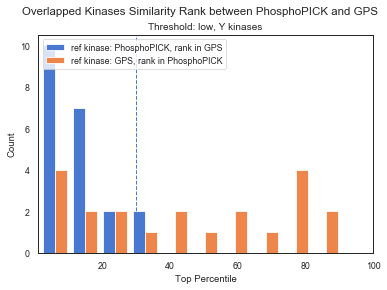

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


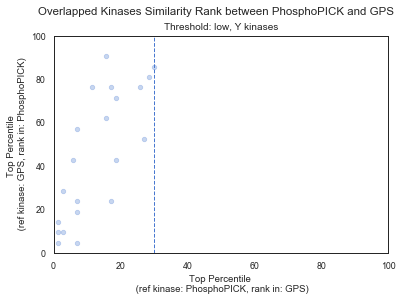

87 overlapped kinases 
 PhosphoPICK :  87 kinases 
 GPS :  243 kinases 



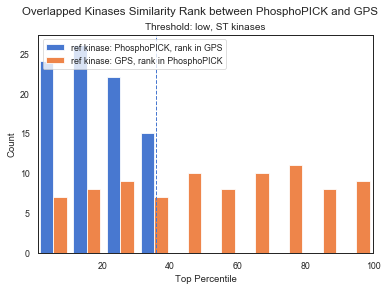

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


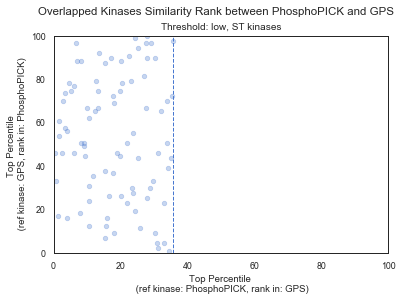

In [27]:
heatmap_y_l_r = pd.read_csv(random_df_dir + 'PhosphoPICK_vs_GPS5.0_low_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_l_r, pp1_y_r, gpsl_y_r , 'PhosphoPICK', 'GPS' )
kin_rank_y_r.to_csv(random_rank_dir + 'low_Y_pp_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'pp', 'gps', 'low', 'Y kinases', random_rank_dir)

heatmap_st_l_r = pd.read_csv(random_df_dir + 'PhosphoPICK_vs_GPS5.0_low_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_l_r, pp1_st_r, gpsl_st_r , 'PhosphoPICK', 'GPS' )
kin_rank_st_r.to_csv(random_rank_dir + 'low_ST_pp_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'pp', 'gps', 'low', 'ST kinases', random_rank_dir)


### PhosphoPICK vs GPS (medium)
- index: kinases in PhosphoPICK
- column: kinases in GPS

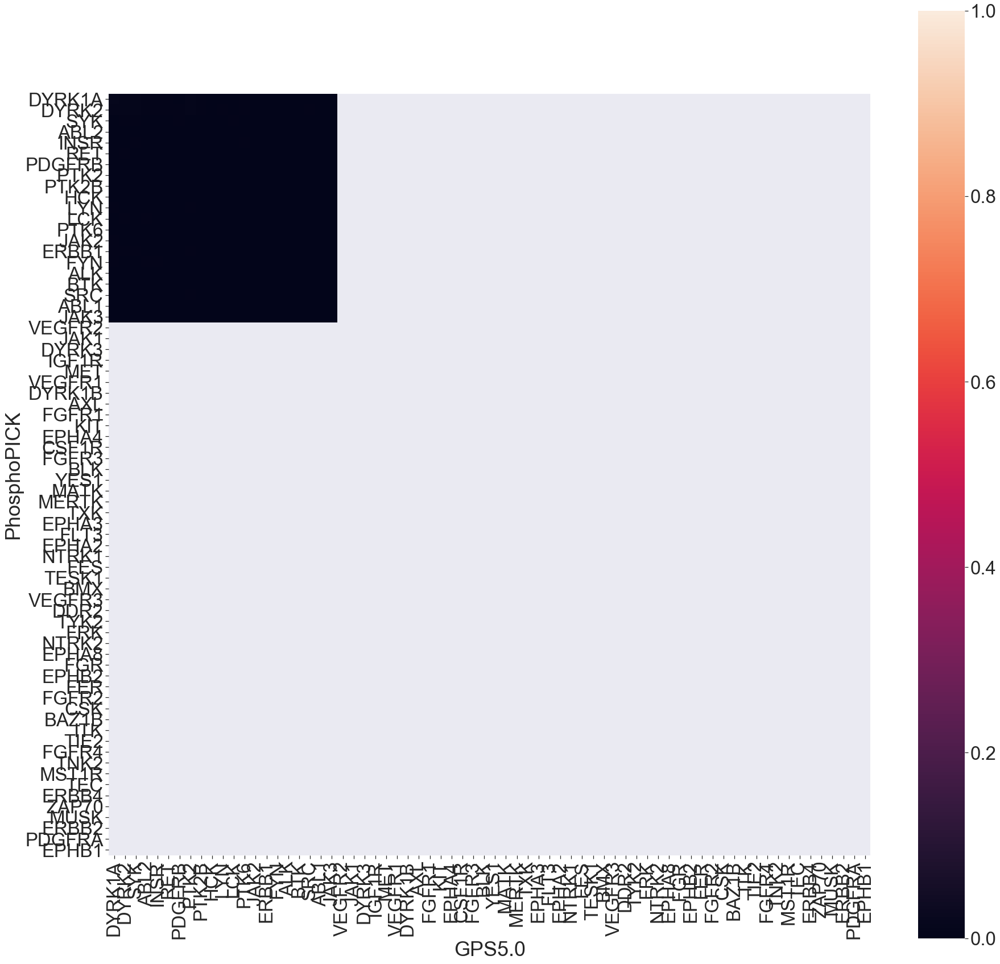

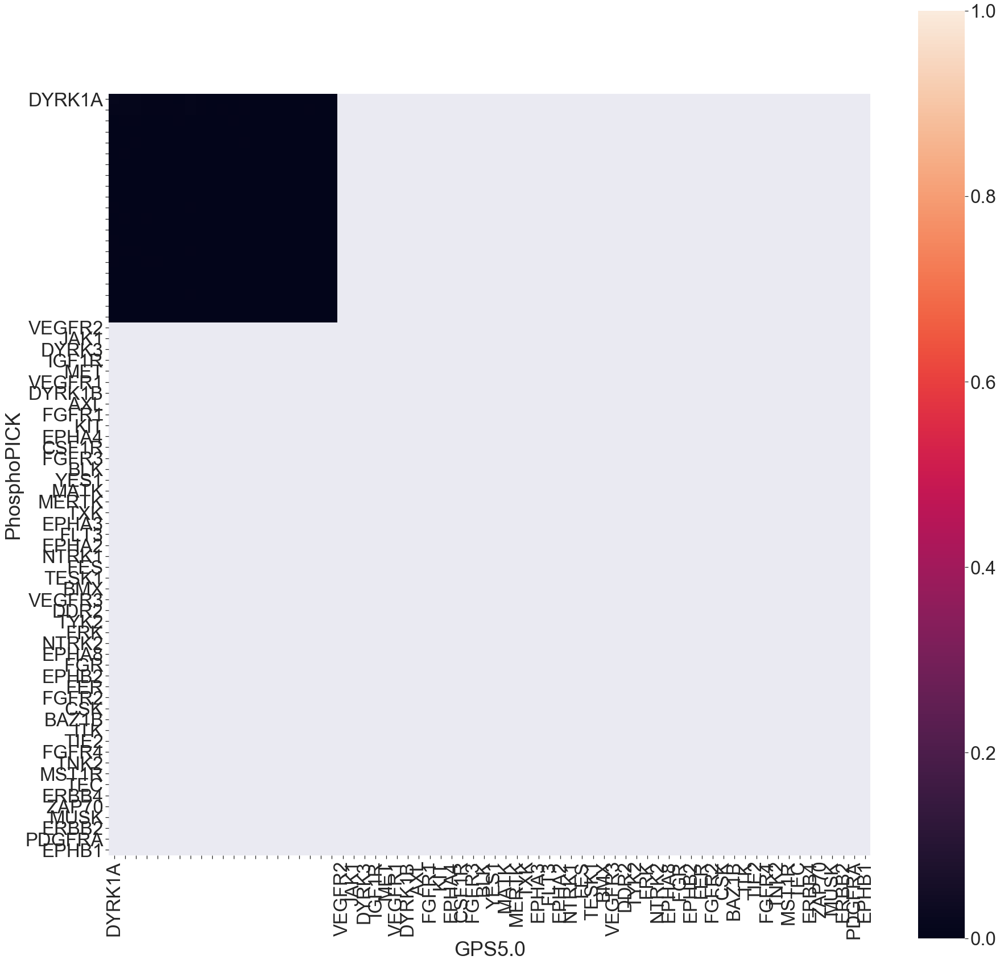

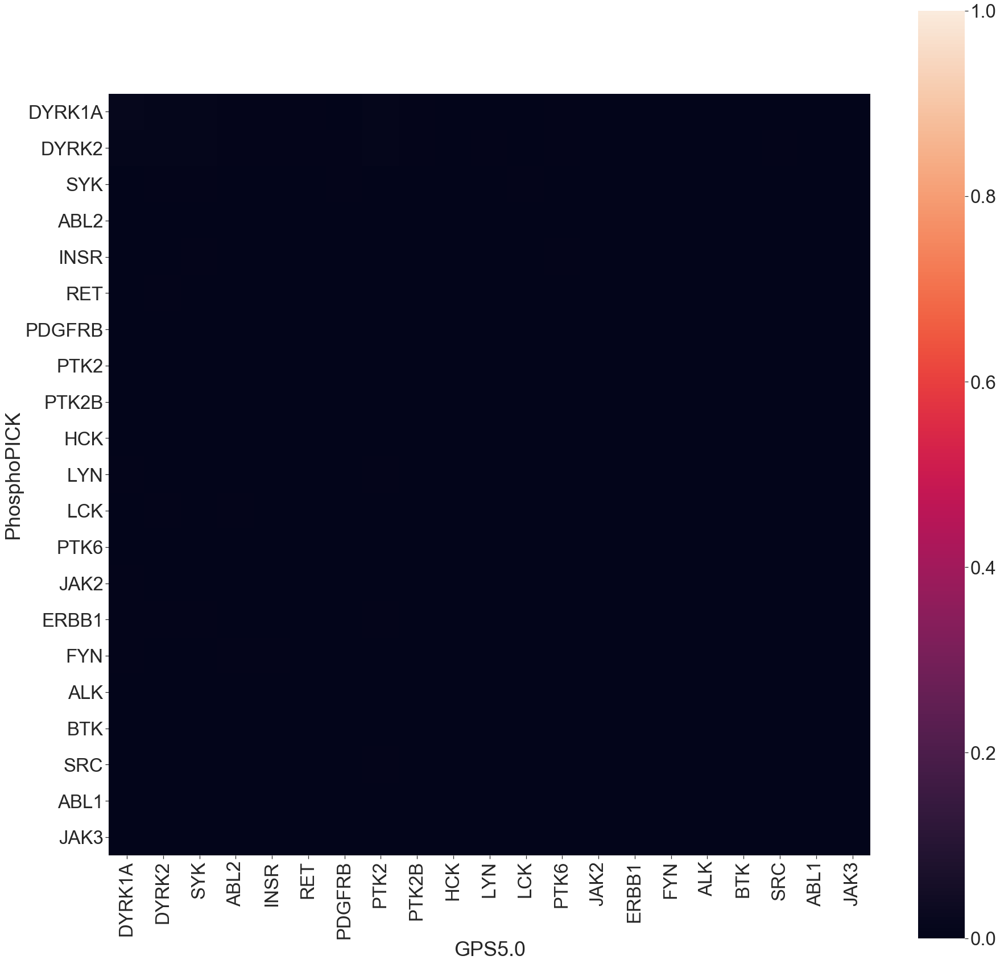

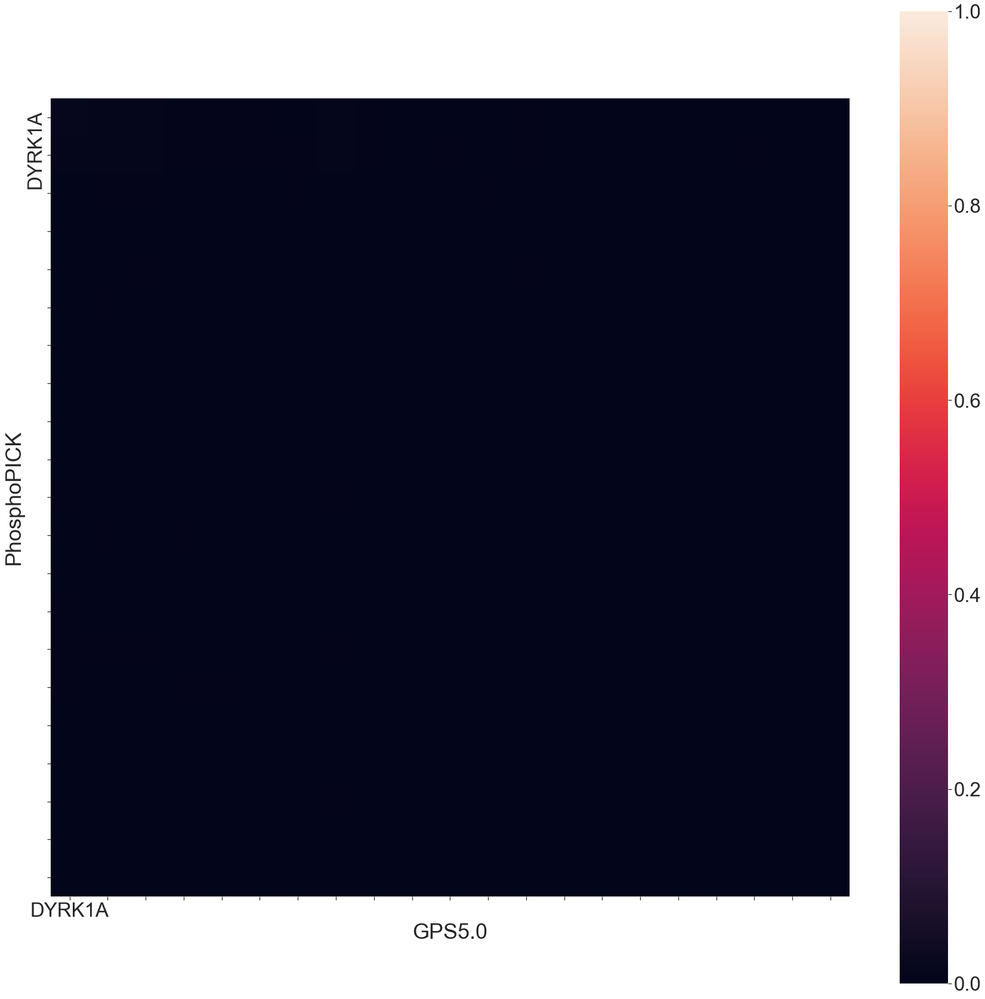

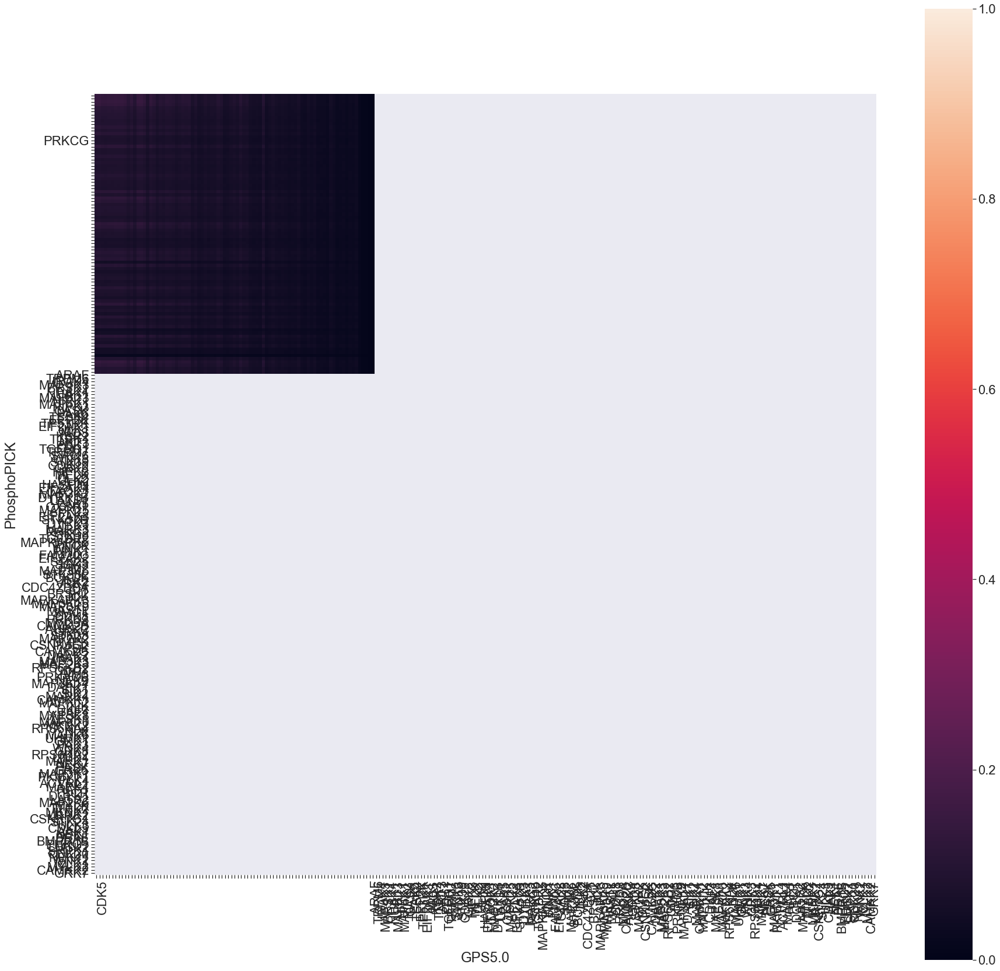

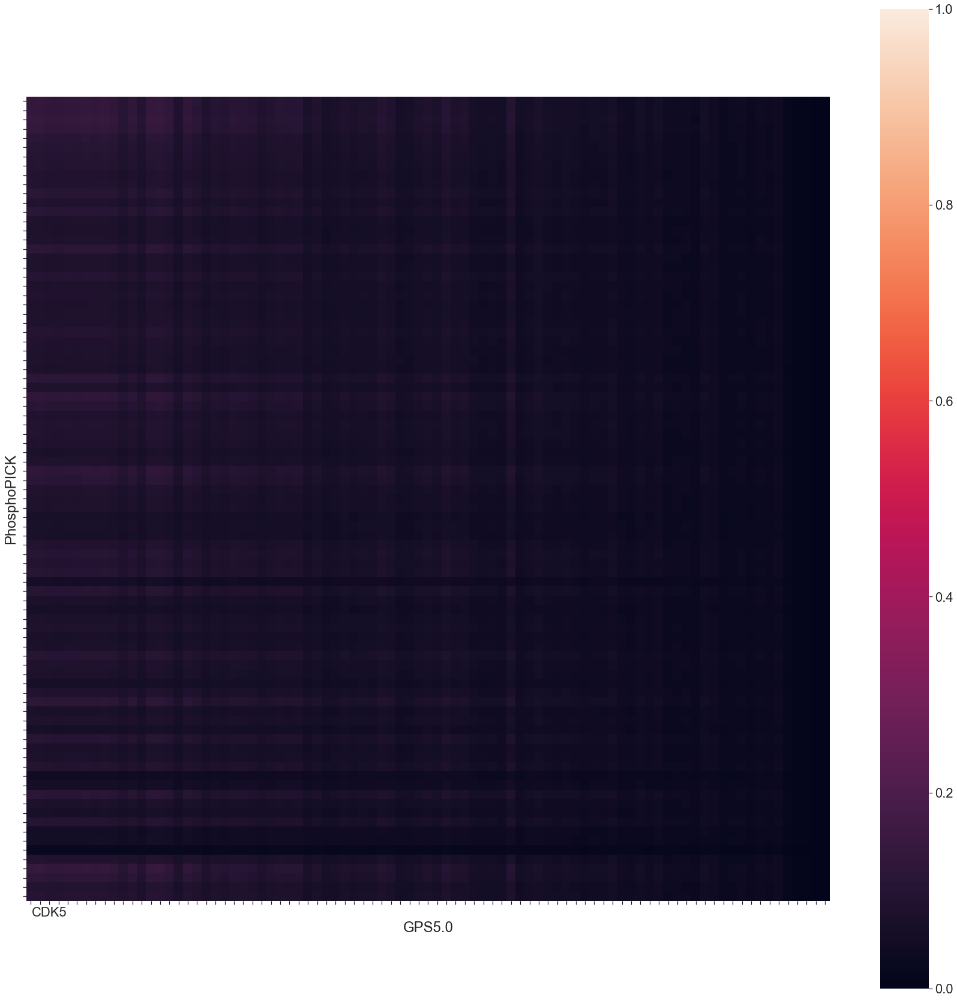

In [28]:
heatmap_y_m_r = kinase_mutual_information.between_predictors(pp06_y_r, gpsm_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'PhosphoPICK_vs_GPS5.0_med_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_m_r, random_heatmap_dir  + 'PhosphoPICK_vs_GPS5.0_med_Y_kinase', 'PhosphoPICK', 'GPS5.0', 'y')

heatmap_st_m_r = kinase_mutual_information.between_predictors(pp06_st_r, gpsm_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'PhosphoPICK_vs_GPS5.0_med_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_m_r, random_heatmap_dir + 'PhosphoPICK_vs_GPS5.0_med_ST_kinase', 'PhosphoPICK', 'GPS5.0', 'st')


21 overlapped kinases 
 PhosphoPICK :  21 kinases 
 GPS :  70 kinases 



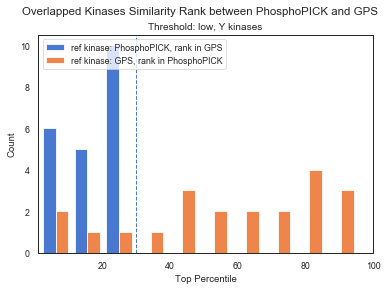

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


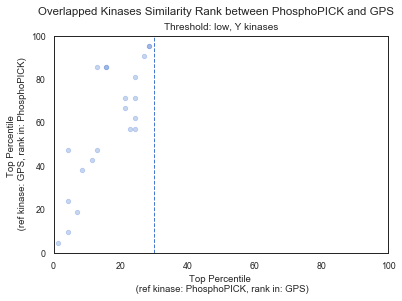

87 overlapped kinases 
 PhosphoPICK :  87 kinases 
 GPS :  243 kinases 



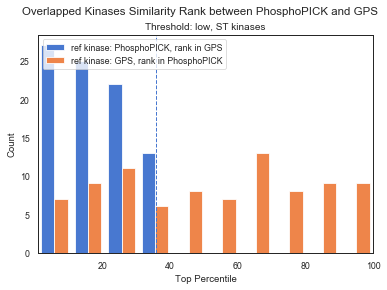

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


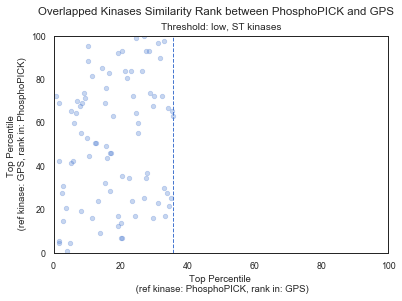

In [29]:
heatmap_y_m_r = pd.read_csv(random_df_dir + 'PhosphoPICK_vs_GPS5.0_med_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_m_r, pp06_y_r, gpsm_y_r , 'PhosphoPICK', 'GPS' )
kin_rank_y_r.to_csv(random_rank_dir + 'med_Y_pp_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'pp', 'gps', 'low', 'Y kinases', random_rank_dir)

heatmap_st_m_r = pd.read_csv(random_df_dir + 'PhosphoPICK_vs_GPS5.0_med_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_m_r, pp06_st_r, gpsm_st_r , 'PhosphoPICK', 'GPS' )
kin_rank_st_r.to_csv(random_rank_dir + 'med_ST_pp_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'pp', 'gps', 'low', 'ST kinases', random_rank_dir)


### PhosphoPICK vs GPS (high)
- index: kinases in PhosphoPICK
- column: kinases in GPS

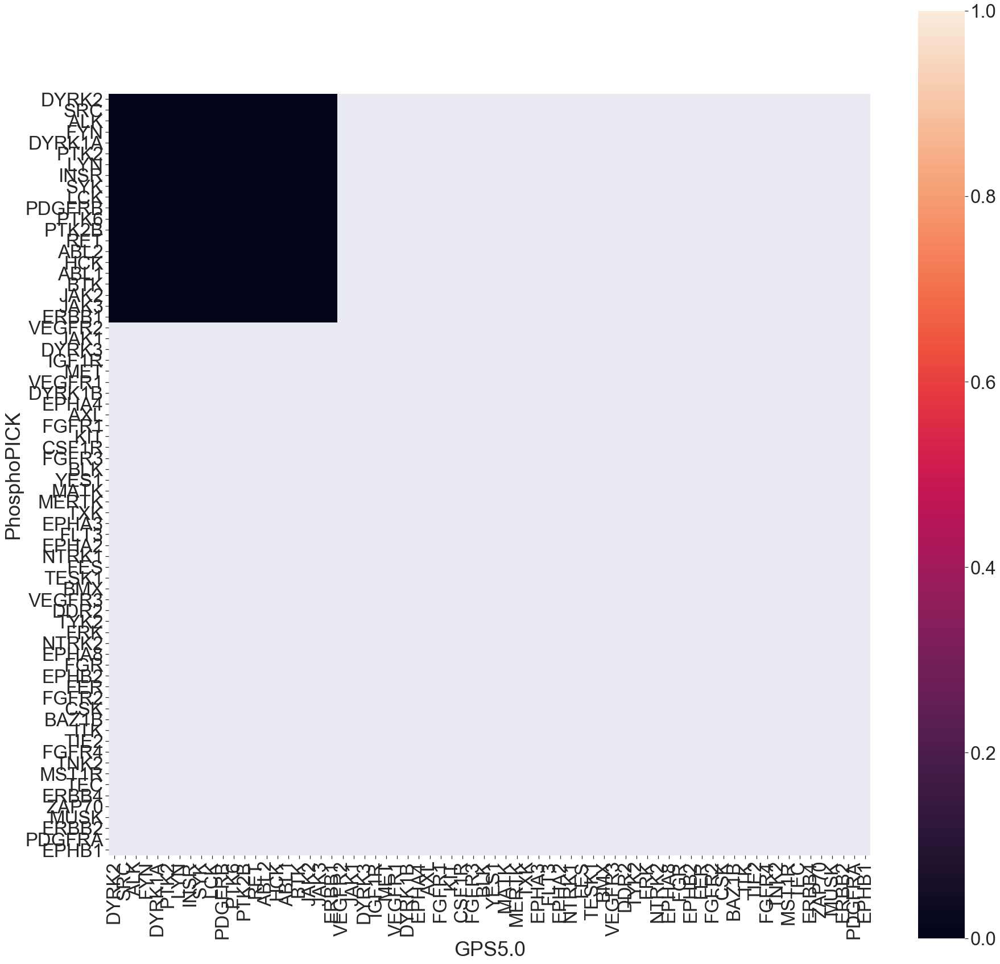

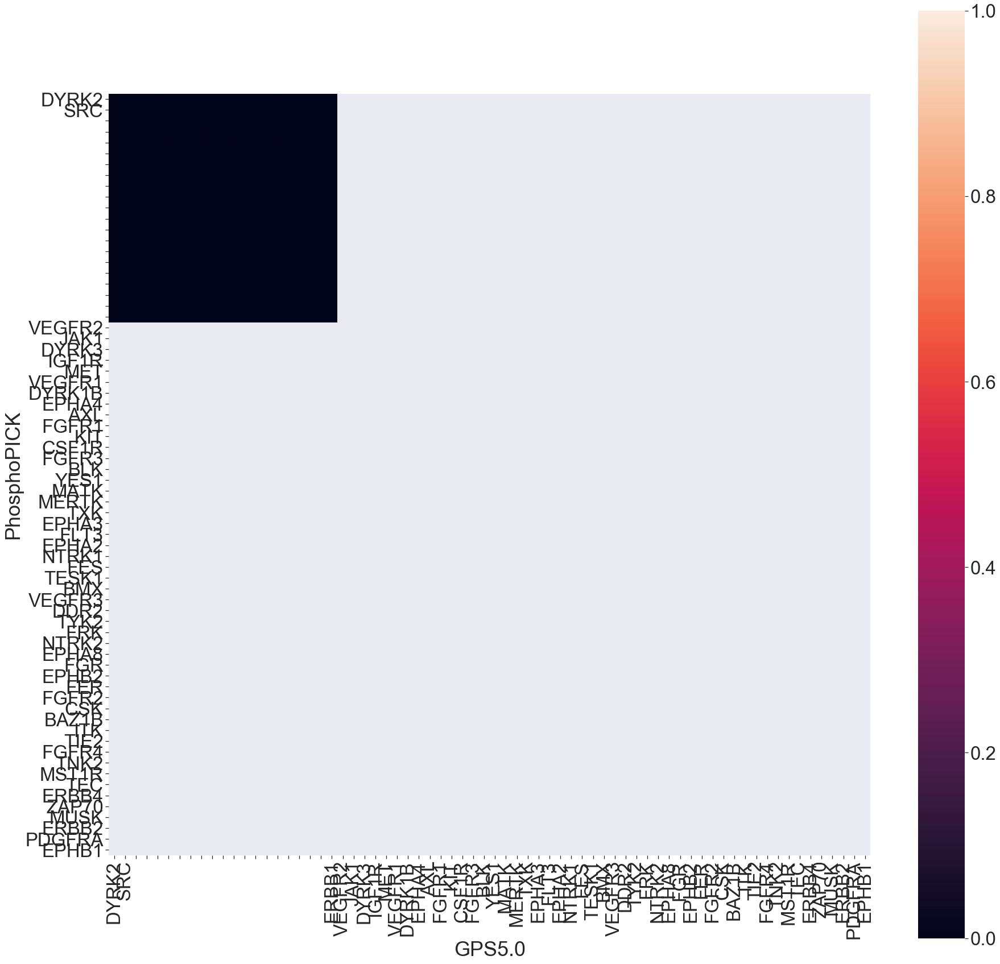

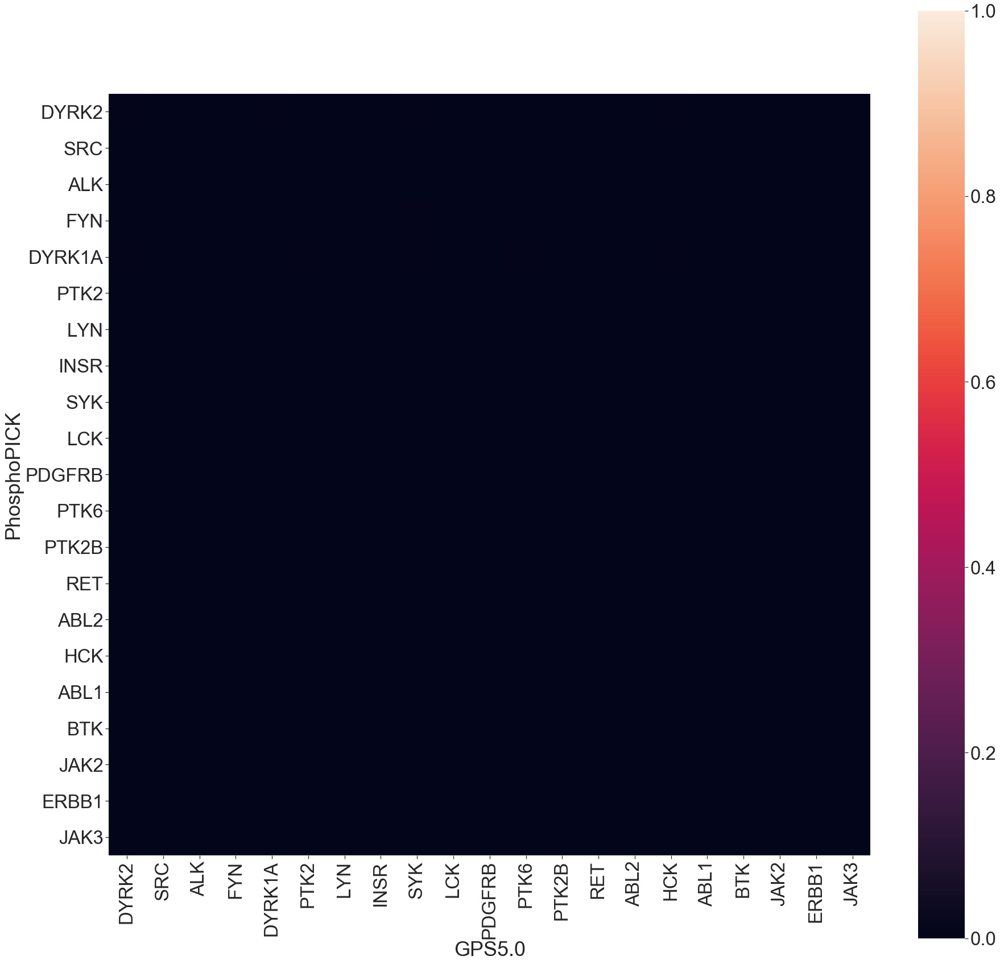

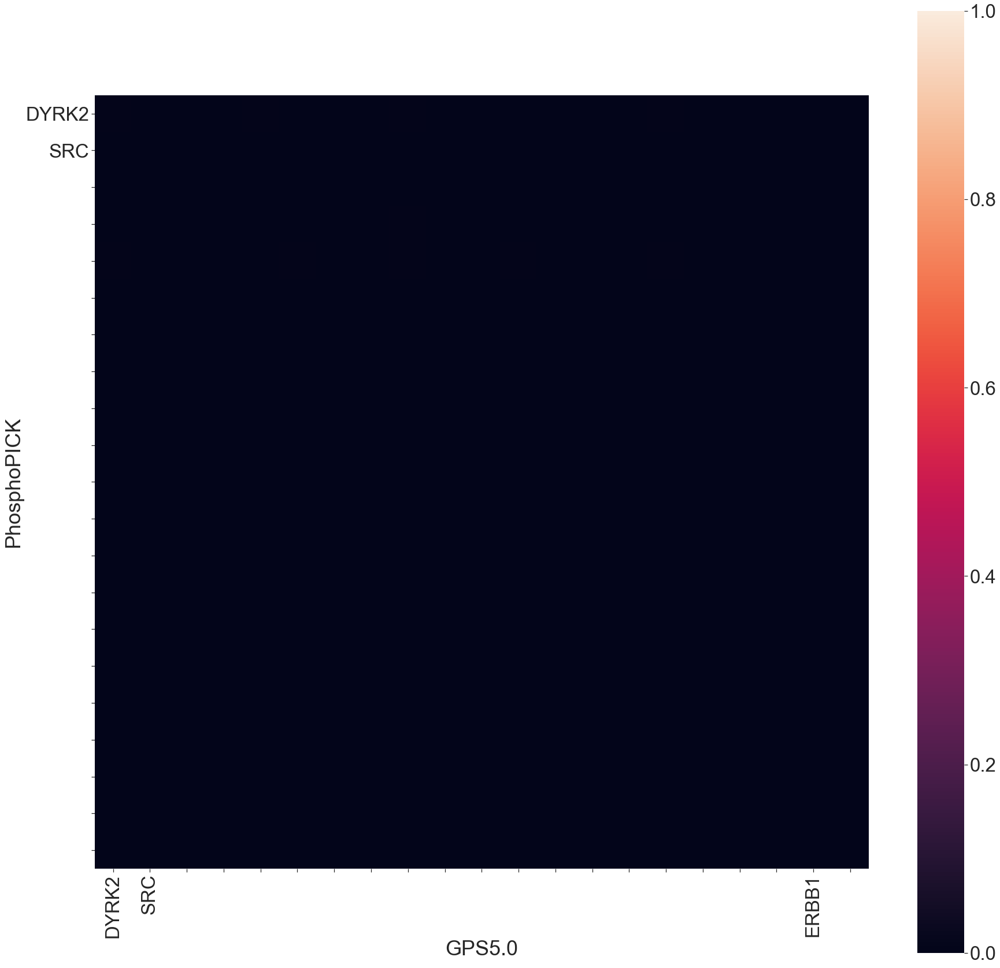

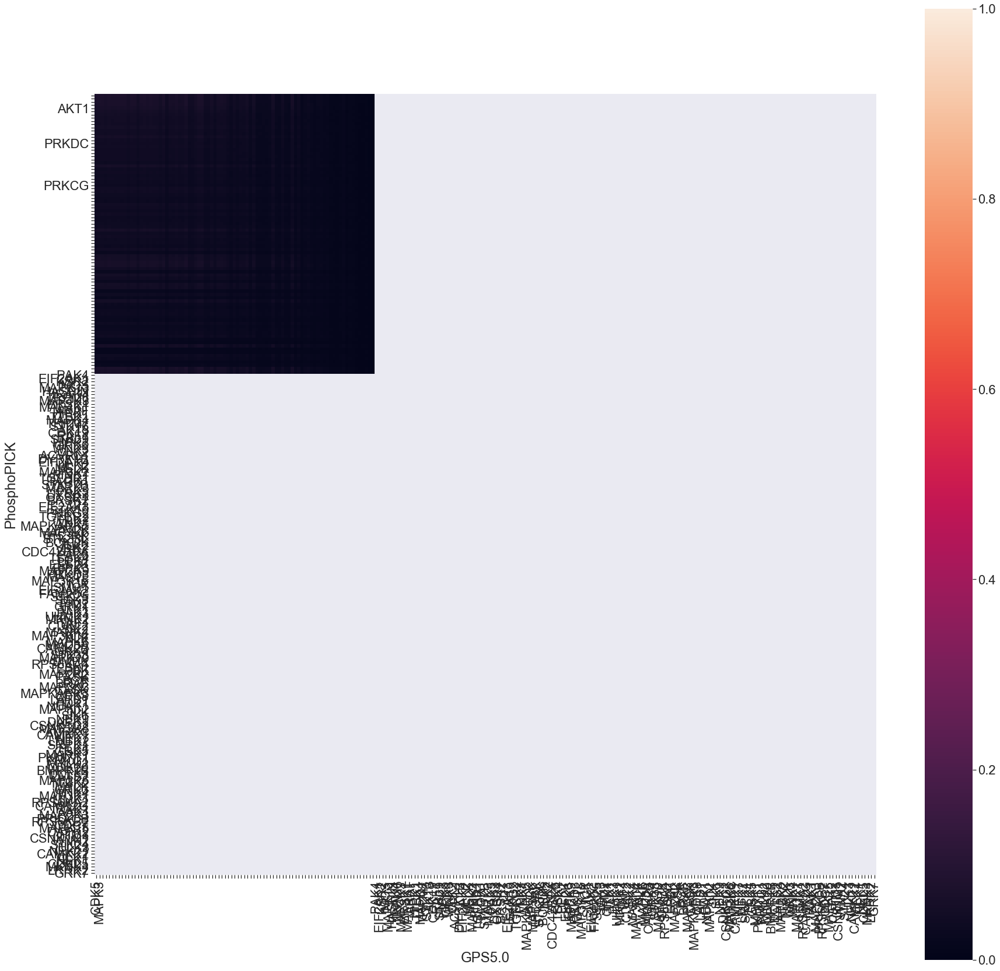

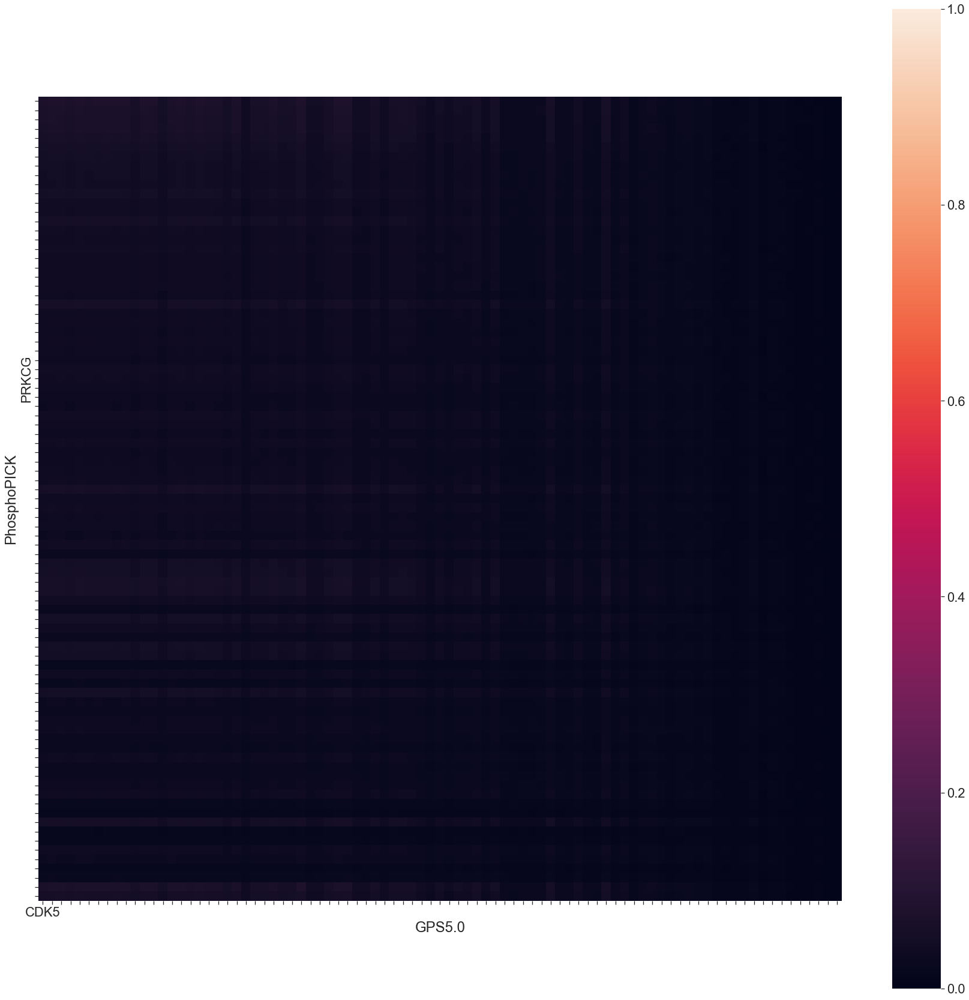

In [30]:
heatmap_y_h_r = kinase_mutual_information.between_predictors(pp02_y_r, gpsh_y_r, 'Kinase Name', 'substrate_id', random_df_dir + 'PhosphoPICK_vs_GPS5.0_high_Y_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_y_h_r, random_heatmap_dir  + 'PhosphoPICK_vs_GPS5.0_high_Y_kinase', 'PhosphoPICK', 'GPS5.0', 'y')

heatmap_st_h_r = kinase_mutual_information.between_predictors(pp02_st_r, gpsh_st_r, 'Kinase Name', 'substrate_id', random_df_dir + 'PhosphoPICK_vs_GPS5.0_high_ST_kinase_heatmap_df')
plot_kinase_heatmap.plot_kinase_heatmap(heatmap_st_h_r, random_heatmap_dir + 'PhosphoPICK_vs_GPS5.0_high_ST_kinase', 'PhosphoPICK', 'GPS5.0', 'st')


21 overlapped kinases 
 PhosphoPICK :  21 kinases 
 GPS :  70 kinases 



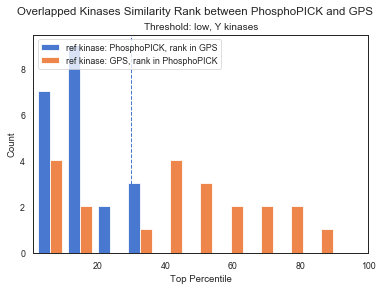

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


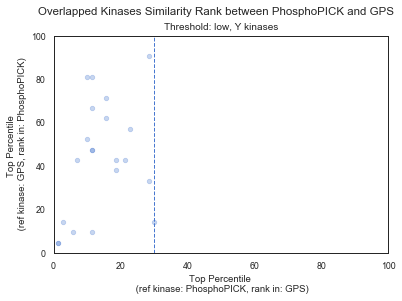

87 overlapped kinases 
 PhosphoPICK :  87 kinases 
 GPS :  243 kinases 



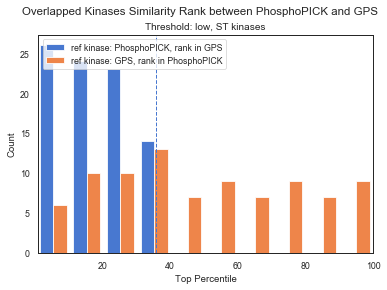

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


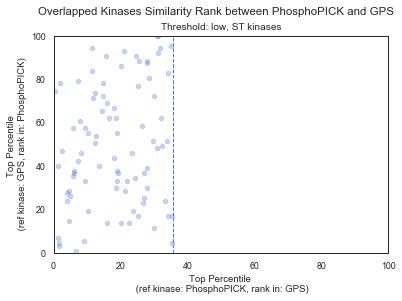

In [31]:
heatmap_y_h_r = pd.read_csv(random_df_dir + 'PhosphoPICK_vs_GPS5.0_high_Y_kinase_heatmap_df.csv', index_col = 0)
kin_rank_y_r = sameKinase_rank.kinase_rank(heatmap_y_h_r, pp02_y_r, gpsh_y_r , 'PhosphoPICK', 'GPS' )
kin_rank_y_r.to_csv(random_rank_dir + 'high_Y_pp_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_y_r, 'pp', 'gps', 'low', 'Y kinases', random_rank_dir)

heatmap_st_h_r = pd.read_csv(random_df_dir + 'PhosphoPICK_vs_GPS5.0_high_ST_kinase_heatmap_df.csv', index_col = 0)
kin_rank_st_r = sameKinase_rank.kinase_rank(heatmap_st_h_r, pp02_st_r, gpsh_st_r , 'PhosphoPICK', 'GPS' )
kin_rank_st_r.to_csv(random_rank_dir + 'high_ST_pp_gps.csv')
plot_sameKinase_rank.plot_rank_relation (kin_rank_st_r, 'pp', 'gps', 'low', 'ST kinases', random_rank_dir)


### CDFs for the same-kinase ranking across stringencies
- load the ranking summary dfs

In [4]:
# PhosphoPICK vs. NetworKIN
# Y kinase
y_l = pd.read_csv(random_rank_dir + 'low_Y_nw_pp.csv')
y_m = pd.read_csv(random_rank_dir + 'med_Y_nw_pp.csv')
y_h = pd.read_csv(random_rank_dir + 'high_Y_nw_pp.csv')
dfs_y_nw_pp = [y_l, y_m, y_h]

# S/T kinase
st_l = pd.read_csv(random_rank_dir + 'low_ST_nw_pp.csv')
st_m = pd.read_csv(random_rank_dir + 'med_ST_nw_pp.csv')
st_h = pd.read_csv(random_rank_dir + 'high_ST_nw_pp.csv')
dfs_st_nw_pp = [st_l, st_m, st_h]


In [5]:
# GPS vs. NetworKIN
y_l = pd.read_csv(random_rank_dir + 'low_Y_nw_gps.csv')
y_m = pd.read_csv(random_rank_dir + 'med_Y_nw_gps.csv')
y_h = pd.read_csv(random_rank_dir + 'high_Y_nw_gps.csv')
dfs_y_nw_gps = [y_l, y_m, y_h]

st_l = pd.read_csv(random_rank_dir + 'low_ST_nw_gps.csv')
st_m = pd.read_csv(random_rank_dir + 'med_ST_nw_gps.csv')
st_h = pd.read_csv(random_rank_dir + 'high_ST_nw_gps.csv')
dfs_st_nw_gps = [st_l, st_m, st_h]

In [6]:
# GPS vs. PhosphoPICK
y_l = pd.read_csv(random_rank_dir + 'low_Y_pp_gps.csv')
y_m = pd.read_csv(random_rank_dir + 'med_Y_pp_gps.csv')
y_h = pd.read_csv(random_rank_dir + 'high_Y_pp_gps.csv')
dfs_y_pp_gps = [y_l, y_m, y_h]

st_l = pd.read_csv(random_rank_dir + 'low_ST_pp_gps.csv')
st_m = pd.read_csv(random_rank_dir + 'med_ST_pp_gps.csv')
st_h = pd.read_csv(random_rank_dir + 'high_ST_pp_gps.csv')
dfs_st_pp_gps = [st_l, st_m, st_h]

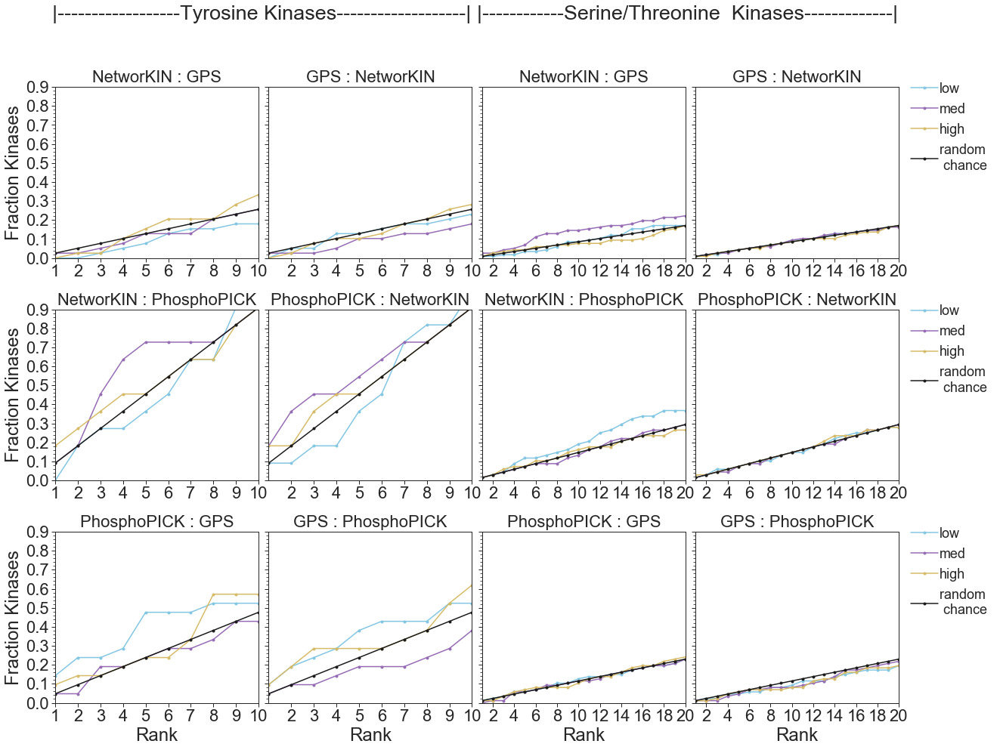

In [8]:
dfs = [dfs_y_nw_gps, dfs_st_nw_gps,
       dfs_y_nw_pp, dfs_st_nw_pp,
       dfs_y_pp_gps, dfs_st_pp_gps]
plot_sameKinase_rank.plot_rank_density (dfs, random_rank_dir + '_')